In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px # to plot the time series plot
from sklearn import metrics # for the evaluation
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
import tensorflow as tf


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Pix_and_power.csv')#[:-1]
 #data.plot(color='red')

In [ ]:
for i in data.select_dtypes('object').columns:
   le = LabelEncoder().fit(data[i])
   data[i] = le.transform(data[i])
data

,time,power,pix,pix_240,pix_220,pix_180,pix_150,Unnamed: 7
0,1081,0.0,0,0,0,0,0,NaN
1,1082,0.0,0,0,0,0,0,NaN
2,1083,0.0,0,0,0,0,0,NaN
3,1084,0.0,0,0,0,0,0,NaN
4,1085,0.0,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...
10915,1076,0.0,0,0,0,0,0,NaN
10916,1077,0.0,0,0,0,0,0,NaN
10917,1078,0.0,0,0,0,0,0,NaN
10918,1079,0.0,0,0,0,0,0,NaN


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


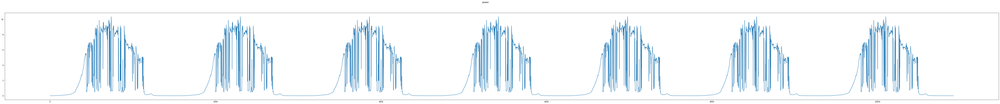

In [ ]:
data.columns
print(data.columns)
all_data = data['power'].values.astype(float)
print(len(all_data))

#training_set = training_set.iloc[:,1:2].values
plt.figure(figsize=(100,9))
plt.plot(all_data)

#plt.plot(power, label = 'AVG power2')
plt.suptitle('power')
plt.show()


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


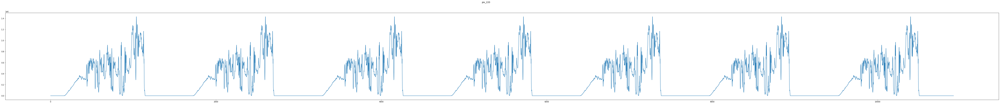

In [ ]:
data.columns
print(data.columns)
pix_data = data['pix_220'].values.astype(float)

print(len(all_data))
plt.figure(figsize=(100,9))

plt.plot(pix_data)

plt.suptitle('pix_220')
plt.show()


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


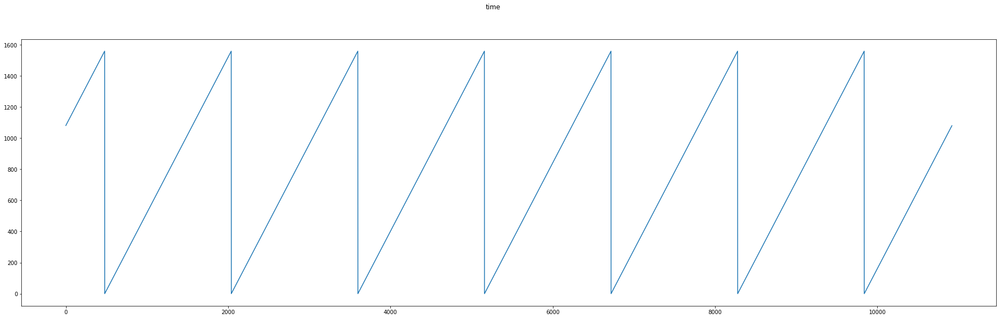

In [ ]:
data.columns
print(data.columns)
pix_data = data['time'].values.astype(float)

print(len(all_data))
plt.figure(figsize=(32,9))


plt.plot(pix_data)

plt.suptitle('time')
plt.show()

In [ ]:
X_scaler = MinMaxScaler()
Y_scaler = MinMaxScaler()
X_data = X_scaler.fit_transform(data[['pix']])
X_data1 = X_scaler.fit_transform(data[['power']])
Y_data = Y_scaler.fit_transform(data[['power']]) #np.array(data[['power']])#
X_data
Y_data

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [ ]:
def custom_ts_multi_data_prep(dataset, target, start, end, window, horizon):
    X = []
    y = []
    start = start + window
    if end is None:
       end = len(dataset) - horizon
    for i in range(start, end):
       indices = range(i-window, i)
       X.append(dataset[indices])
       #print(X)
       indicey = range(i+1, i+1+horizon)
       y.append(target[indicey][-1])
    return np.array(X), np.array(y)

In [ ]:
hist_window = 80
horizon = 20
TRAIN_SPLIT = int(len(X_data)*0.7)

x_train, y_train = custom_ts_multi_data_prep(X_data, Y_data, 0, TRAIN_SPLIT, hist_window, horizon)
x_vali, y_vali = custom_ts_multi_data_prep(X_data, Y_data, TRAIN_SPLIT, None, hist_window, horizon)

x_train1, y_train1 = custom_ts_multi_data_prep(X_data1, Y_data, 0, TRAIN_SPLIT, hist_window, horizon)
x_vali1, y_vali1 = custom_ts_multi_data_prep(X_data1, Y_data, TRAIN_SPLIT, None, hist_window, horizon)
print(len(x_train),len(x_train1))
#len(Y_data)

7563 7563


In [ ]:
#print ('Multiple window of past history\n')
#print(x_train[0])
#print ('\n Target horizon\n')
#print (y_train[0])

In [ ]:
batch_size = 64
buffer_size = 10
train_data = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_data = train_data.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data = tf.data.Dataset.from_tensor_slices((x_vali, y_vali))
val_data = val_data.batch(batch_size).repeat()

train_data1 = tf.data.Dataset.from_tensor_slices((x_train1, y_train1))
train_data1 = train_data1.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data1 = tf.data.Dataset.from_tensor_slices((x_vali1, y_vali1))
val_data1 = val_data1.batch(batch_size).repeat()
val_data
x_train.shape[-2:]


(80, 1)

In [ ]:
lstm_model = tf.keras.models.Sequential([
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True),input_shape=x_train.shape[-2:]),
  #tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # # #tf.keras.layers.Dropout(0.2),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= False)),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(8, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1),
 ])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 80, 64)           8704      
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 80, 64)           24832     
 nal)                                                            
                                                                 
 bidirectional_2 (Bidirectio  (None, 80, 32)           10368     
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 80, 32)           6272      
 nal)                                                            
                                                                 
 bidirectional_4 (Bidirectio  (None, 80, 16)           2

In [ ]:
model_path = '/content/drive/MyDrive/SkyImageModel_220_test1.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint]

In [ ]:
history = lstm_model.fit(train_data,epochs=75,steps_per_epoch=100,validation_data=val_data,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/75
100/100 [==============================] - 67s 436ms/step - loss: 0.1249 - val_loss: 0.0610
Epoch 2/75
100/100 [==============================] - 37s 365ms/step - loss: 0.0875 - val_loss: 0.0627
Epoch 3/75
100/100 [==============================] - 37s 367ms/step - loss: 0.0869 - val_loss: 0.0507
Epoch 4/75
100/100 [==============================] - 36s 365ms/step - loss: 0.0765 - val_loss: 0.0493
Epoch 5/75
100/100 [==============================] - 37s 371ms/step - loss: 0.0691 - val_loss: 0.0470
Epoch 6/75
100/100 [==============================] - 37s 372ms/step - loss: 0.0716 - val_loss: 0.0483
Epoch 7/75
100/100 [==============================] - 36s 364ms/step - loss: 0.0671 - val_loss: 0.0460
Epoch 8/75
100/100 [==============================] - 37s 370ms/step - loss: 0.0739 - val_loss: 0.0446
Epoch 9/75
100/100 [==============================] - 38s 377ms/step - loss: 0.0623 - val_loss: 0.0355
Epoch 10/75
100/100 [==============================] - 36s 362ms/step - l

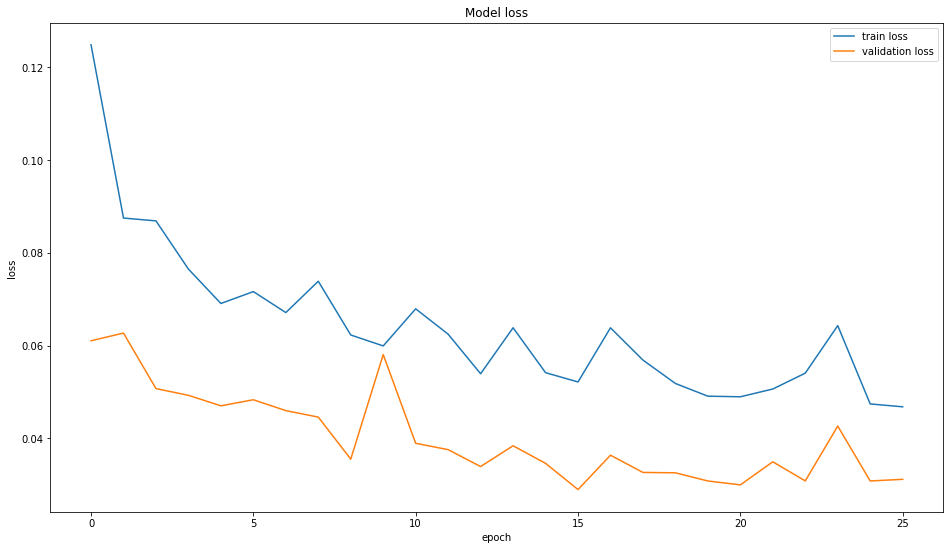

In [ ]:


plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show()

In [ ]:
# num = int(len(data[[ 'pix']])/7)

In [ ]:
# data_val = X_scaler.fit_transform(data[[ 'pix_220']])[:num]
# Expected = X_scaler.fit_transform(data[['power' ]])[:num]
# print(len(Expected))
# print(len(data_val))

In [ ]:
# data_for_pred, Expected_val = custom_ts_multi_data_prep(data_val, Expected, 0, None, hist_window, horizon)

In [ ]:
# pred = []
# print(len(data_for_pred))

# for i in data_for_pred:
#   #print(len(i))
#   #print(i.shpae)
#   i = i.reshape(1, i.shape[0], i.shape[1])
#   pred.append(lstm_model.predict(i))
#   #break
# #pred = np.array(pred)
# pred[0][0]

In [ ]:
# act_pred =[]
# for preds in pred:
#   #print(preds)

#   pred_Inverse = Y_scaler.inverse_transform(preds)
#   act_pred.append(pred_Inverse)
# len(act_pred)
# #act_pred

In [ ]:
# predn = []
# for item in list(act_pred):
#   item = float(item[0])
#   item = round(item, 2)
#   predn.append(item)
#   #print(item)
# #pred

In [ ]:
# Expected = Y_scaler.inverse_transform(Expected)
# Expected
# Expected_list = []
# for item in list(Expected):
#   Expected_list.append(float(item[0]))
#   #print(item)
# len(Expected)

In [ ]:
# plt.figure(figsize=(50,12))
# #
# plt.plot( list(Expected[len(Expected)-len(predn):]))
# plt.plot(predn)
# # plt.plot(pred1)
# plt.title("Actual vs Predicted_image")
# plt.ylabel("Generation")
# plt.legend(('Actual','predicted_image'))
# plt.show()

In [ ]:
lstm_model1 = tf.keras.models.Sequential([
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True),input_shape=x_train.shape[-2:]),
  #tf.keras.layers.Dropout(0.2),
  #  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # #tf.keras.layers.Dropout(0.2),
  # # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= False)),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(8, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1),
 ])
lstm_model1.compile(optimizer='adam', loss='mse')
lstm_model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_6 (Bidirectio  (None, 80, 64)           8704      
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, 80, 32)           10368     
 nal)                                                            
                                                                 
 bidirectional_8 (Bidirectio  (None, 16)               2624      
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 8)                 136       
                                                                 
 dropout_4 (Dropout)         (None, 8)                 0         
                                                      

In [ ]:
model_path = '/content/drive/MyDrive/StatisticsModel_220_test1.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint]

In [ ]:
history = lstm_model1.fit(train_data1,epochs=50,steps_per_epoch=100,validation_data=val_data1,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/50
100/100 [==============================] - 33s 211ms/step - loss: 0.0898 - val_loss: 0.0488
Epoch 2/50
100/100 [==============================] - 18s 182ms/step - loss: 0.0745 - val_loss: 0.0588
Epoch 3/50
100/100 [==============================] - 18s 182ms/step - loss: 0.0746 - val_loss: 0.0445
Epoch 4/50
100/100 [==============================] - 18s 178ms/step - loss: 0.0619 - val_loss: 0.0447
Epoch 5/50
100/100 [==============================] - 18s 179ms/step - loss: 0.0599 - val_loss: 0.0460
Epoch 6/50
100/100 [==============================] - 17s 175ms/step - loss: 0.0605 - val_loss: 0.0488
Epoch 7/50
100/100 [==============================] - 19s 185ms/step - loss: 0.0603 - val_loss: 0.0469
Epoch 8/50
100/100 [==============================] - 18s 179ms/step - loss: 0.0659 - val_loss: 0.0422
Epoch 9/50
100/100 [==============================] - 18s 184ms/step - loss: 0.0574 - val_loss: 0.0417
Epoch 10/50
100/100 [==============================] - 18s 179ms/step - l

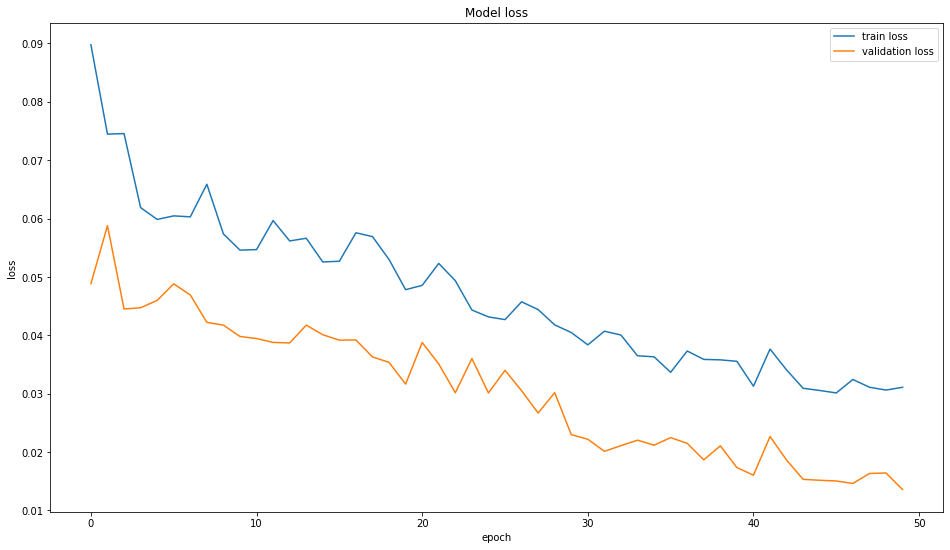

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show()

In [ ]:
 num = int(len(data[[ 'pix']])/7)

In [ ]:
data_val = X_scaler.fit_transform(data[[ 'pix_240']])[:num]
Expected = X_scaler.fit_transform(data[['power' ]])[:num]
print(len(Expected))
print(len(data_val))

1560
1560


In [ ]:
data_val1 = X_scaler.fit_transform(data[[ 'power']])[:num]
Expected1 = X_scaler.fit_transform(data[['power' ]])[:num]
print(len(Expected1))
print(len(data_val1))

1560
1560


In [ ]:
data_for_pred, Expected_val = custom_ts_multi_data_prep(data_val, Expected, 0, None, hist_window, horizon)
data_for_pred1, Expected_val1 = custom_ts_multi_data_prep(data_val1, Expected1, 0, None, hist_window, horizon)
#data_for_pred[0], Expected_val[0]

In [ ]:
# len(data_for_pred)

In [ ]:
pred = []
print(len(data_for_pred))

for i in data_for_pred:
  #print(len(i))
  #print(i.shpae)
  i = i.reshape(1, i.shape[0], i.shape[1])
  pred.append(lstm_model.predict(i))
  #break
#pred = np.array(pred)
pred[0][0]

1460


array([0.08571316], dtype=float32)

In [ ]:
pred1 = []
print(len(data_for_pred1))

for i in data_for_pred1:
  #print(len(i))
  #print(i.shpae)
  i = i.reshape(1, i.shape[0], i.shape[1])
  pred1.append(lstm_model1.predict(i))
  #break
#pred = np.array(pred)
pred1[0][0]

1460


array([0.04074903], dtype=float32)

In [ ]:
#pred

In [ ]:
act_pred =[]
for preds in pred:
  #print(preds)

  pred_Inverse = Y_scaler.inverse_transform(preds)
  act_pred.append(pred_Inverse)
len(act_pred)
#act_pred

1460

In [ ]:
act_pred1 =[]
for preds in pred1:
  #print(preds)

  pred_Inverse = Y_scaler.inverse_transform(preds)
  act_pred1.append(pred_Inverse)
len(act_pred1)

1460

In [ ]:
predn = []
for item in list(act_pred):
  item = float(item[0])
  item = round(item, 2)
  predn.append(item)
  #print(item)
#pred

In [ ]:
predn1 = []
for item in list(act_pred1):
  item = float(item[0])
  item = round(item, 2)
  predn1.append(item)
  #print(item)
#pred

In [ ]:
len(Expected), len(pred)

(1560, 1460)

In [ ]:
Expected = Y_scaler.inverse_transform(Expected)
Expected
Expected_list = []
for item in list(Expected):
  Expected_list.append(float(item[0]))
  #print(item)
len(Expected)

1560

In [ ]:
Expected1 = Expected[len(Expected)-len(predn):]

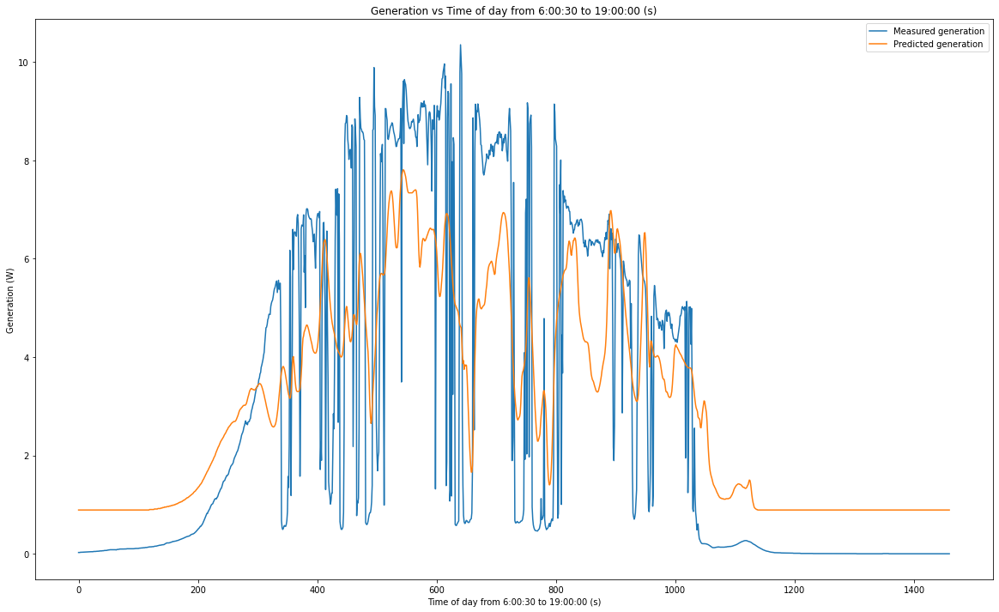

In [ ]:
plt.figure(figsize=(20,12))
#
plt.plot( list(Expected1))
plt.plot(predn)
# plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()

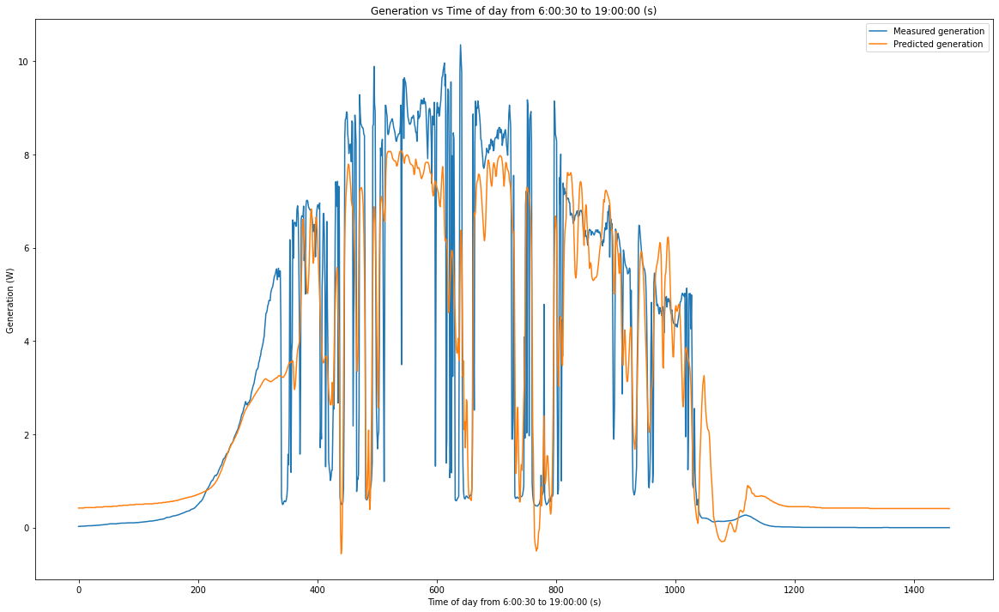

In [ ]:
plt.figure(figsize=(20,12))
#
plt.plot( list(Expected1))
plt.plot(predn1)
#plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()

In [ ]:
rmse = []
for i in range(len(Expected1)):
  per_err = (Expected1[i][0] - predn[i])**2
  # print(per_err)
  rmse.append(per_err)
rmse = list(rmse)
rmse = (sum(rmse)/len(rmse))**0.5
print('rmse value sky imagery model',rmse)

rmse value sky imagery model 1.8814184355325174


In [ ]:
rmse = []
for i in range(len(predn1)):
  per_err = (Expected1[i][0] - predn1[i])**2
  rmse.append(per_err)
rmse = list(rmse)
rmse = (sum(rmse)/len(rmse))**0.5
print('rmse value statistical model',rmse)

rmse value statistical model 1.252378419210462


In [ ]:
mape = []
count = 0
for i in range(len(pred1)):
  if (Expected[i][0] > pred1[i]):
    count+=1
  per_err = (Expected[i][0] - pred1[i]) / pred1[i]
  per_err = abs(per_err)
  #print(Expected[i][0],pred[i],Expected[i][0]-pred[i], per_err)
  mape.append(per_err)
mape = list(mape)
mape = sum(mape)/len(mape)
mape

array([[36.061264]], dtype=float32)

In [ ]:
def rmse1(pred, expected):
  rmse = []

  for i in range(len(pred)):
    per_err = (Expected1[i][0] - pred[i])**2
    rmse.append(per_err)
  rmse = list(rmse)
  rmse = (sum(rmse)/len(rmse))**0.5
  return rmse

In [ ]:
predn1[0]*0.9

0.378

In [ ]:
ensemble = []
for i in range(len(pred)):
  ensemble.append((predn[i]*0.9+predn1[i]*0.1))
print(ensemble)
rmse1(ensemble,Expected1)


[0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8430000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8440000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8450000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001, 0.8460000000000001,

1.7910616431495872

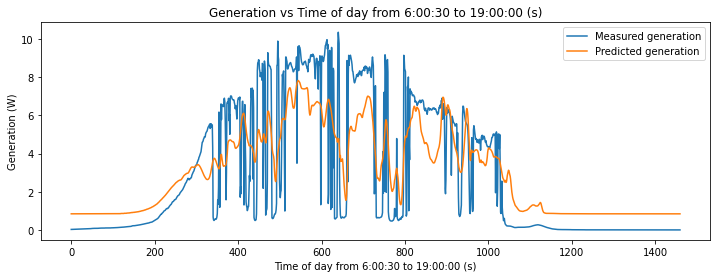

In [ ]:
plt.figure(figsize=(12,4))
#
plt.plot( list(Expected1))
plt.plot(ensemble)
#plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()

In [ ]:
weights_list = list(range(0,100,1))
print(weights_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


In [ ]:

ensemble = []
RMSE = []
for weight in weights_list:
  weight = weight/100
  ensemble_new=[]
  for i in range(len(pred)):
    ensemble_new.append((predn[i]*(1-weight)+predn1[i]*weight))


  RMSE.append(rmse1(ensemble_new,Expected1))
  ensemble.append(ensemble_new)

In [ ]:
ensemble[0]


[0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.89,
 0.9,
 0.9,
 0.9,
 0.9,
 0.9,
 0.9,
 0.9,
 0.9,
 0.91,
 0.91,
 0.91,
 0.91,
 0.91,
 0.91,
 0.92,
 0.92,
 0.92,
 0.92,
 0.92,
 0.93,
 0.93,
 0.93,
 0.94,
 0.94,
 0.94,


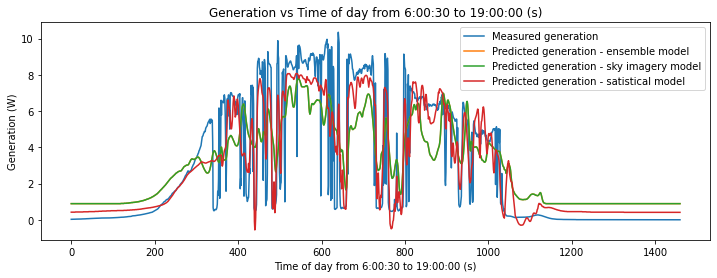

1.8814184355325174 1.0


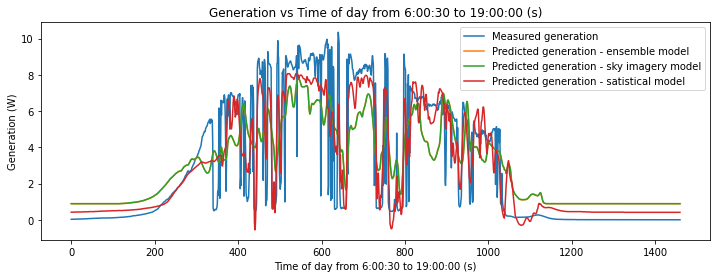

1.8722192515798817 2.0


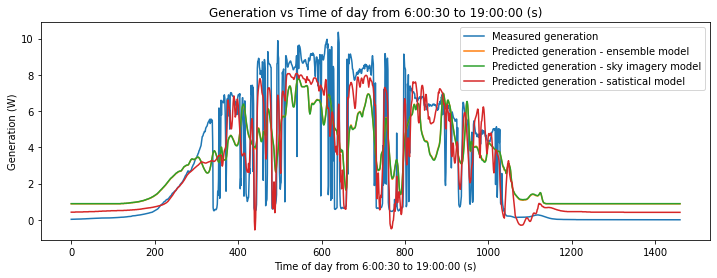

1.8630549823356084 3.0


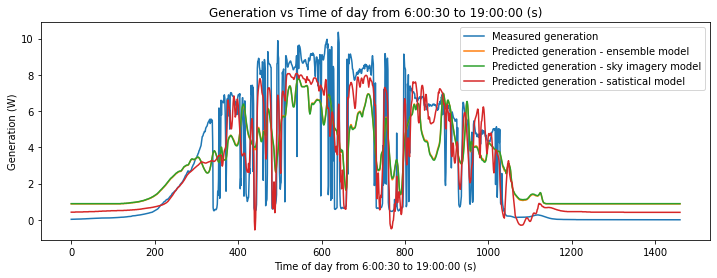

1.8539261455676013 4.0


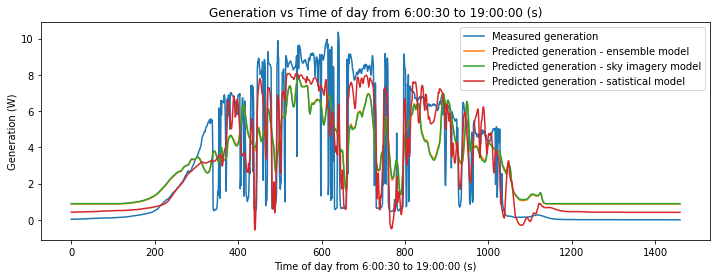

1.8448332672703474 5.0


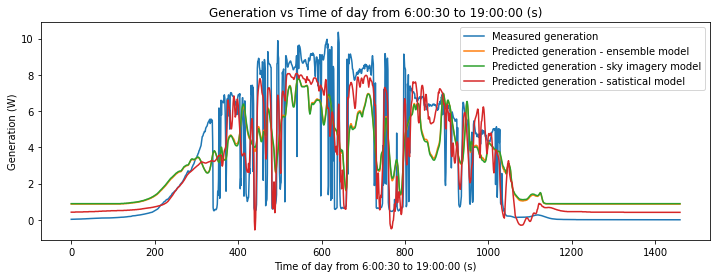

1.8357768817669786 6.0


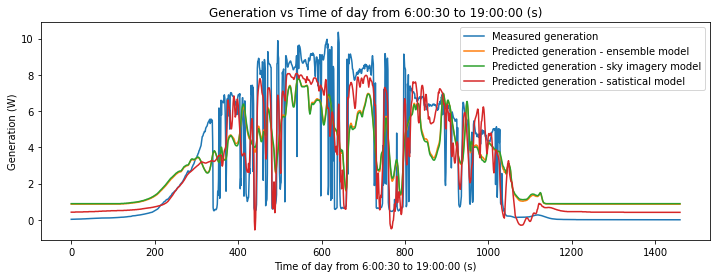

1.826757531810783 7.000000000000001


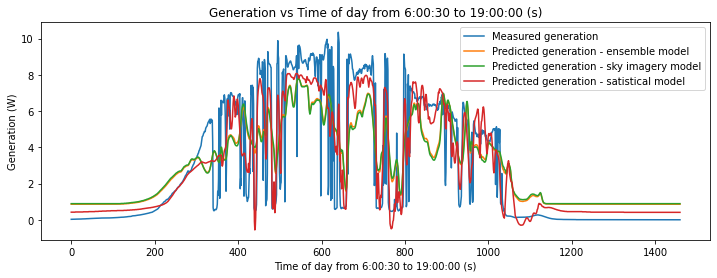

1.8177757686852323 8.0


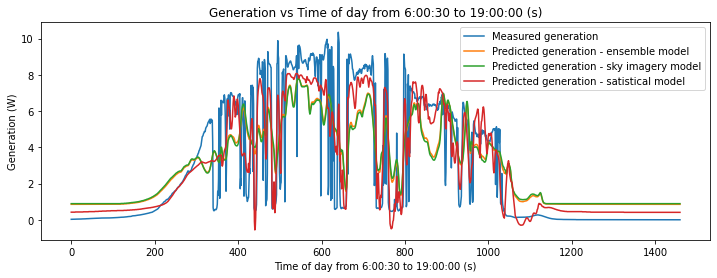

1.8088321523030861 9.0


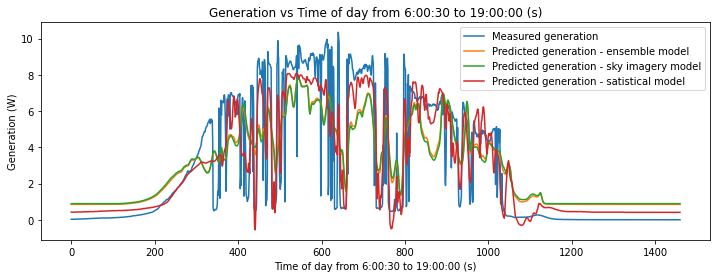

1.7999272513038624 10.0


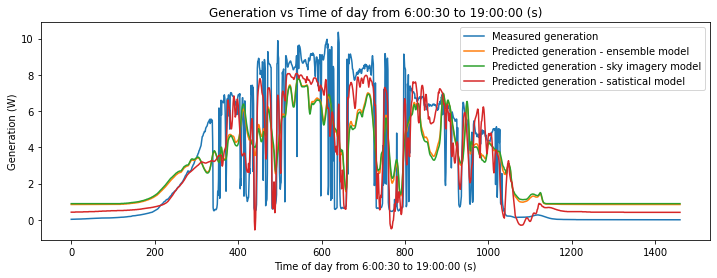

1.7910616431495872 11.0


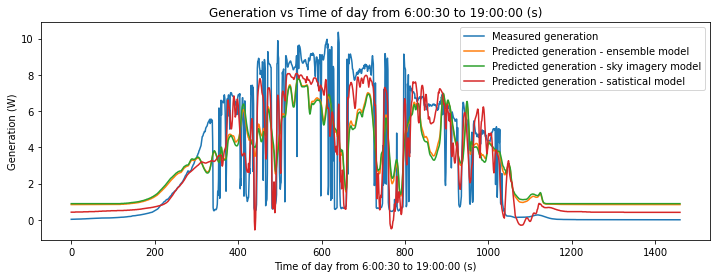

1.7822359142188526 12.0


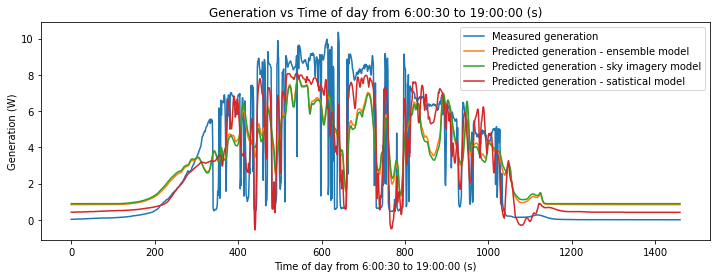

1.773450659898913 13.0


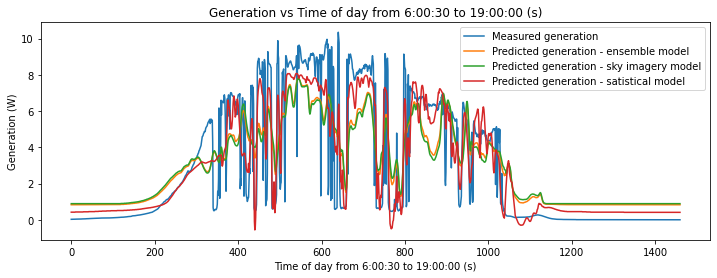

1.764706484675235 14.000000000000002


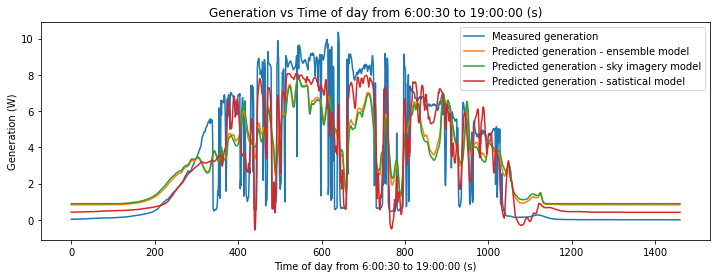

1.7560040022187282 15.0


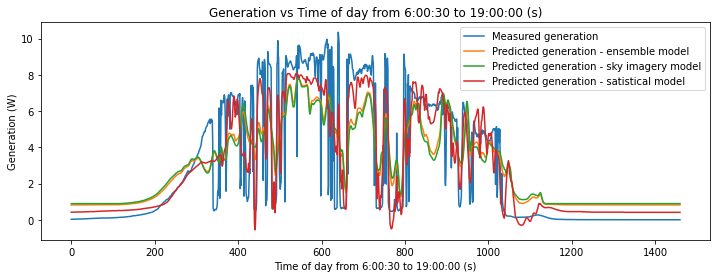

1.747343835470332 16.0


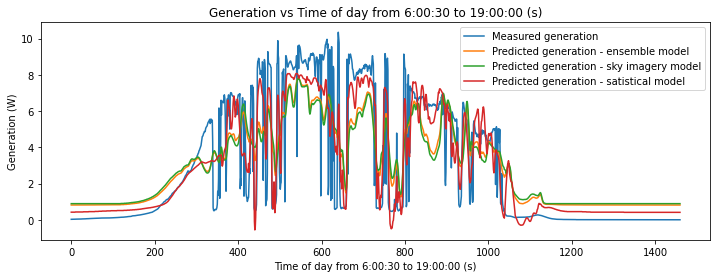

1.738726616722311 17.0


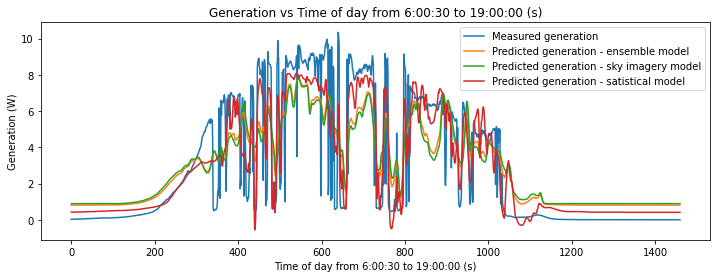

1.7301529876966308 18.0


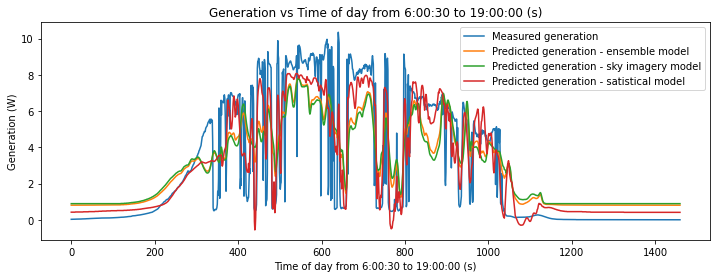

1.7216235996195903 19.0


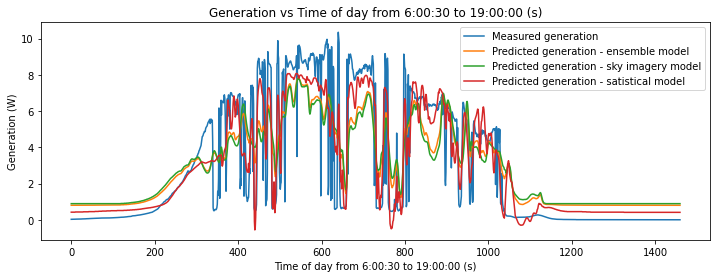

1.713139113292657 20.0


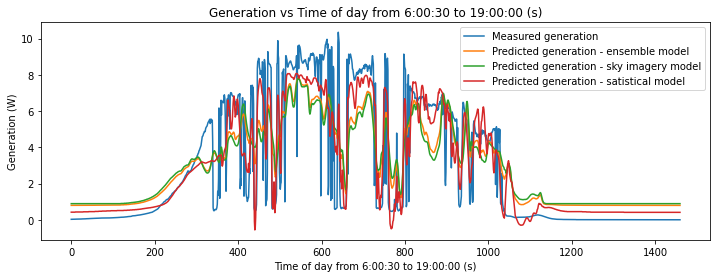

1.7047001991592916 21.0


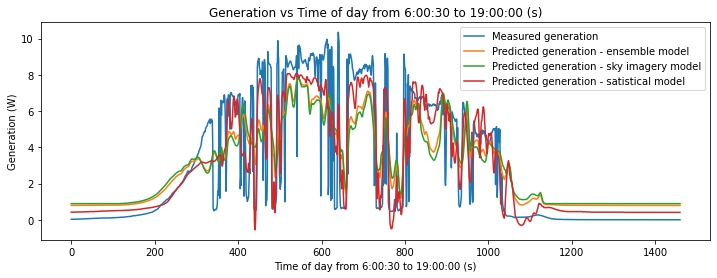

1.696307537367198 22.0


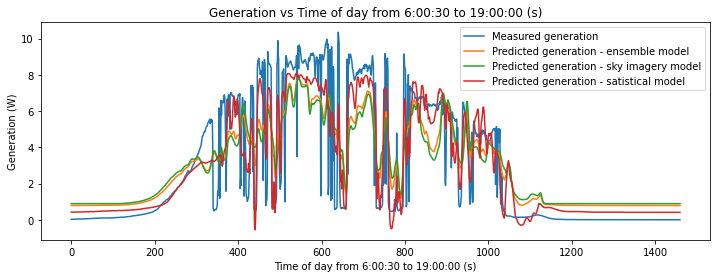

1.6879618178259723 23.0


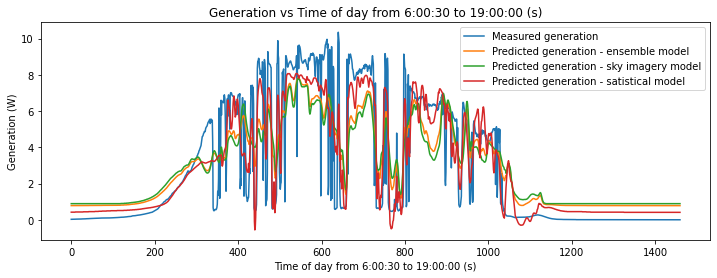

1.6796637402594778 24.0


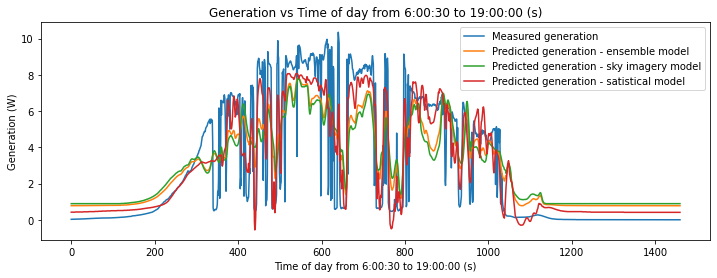

1.671414014252936 25.0


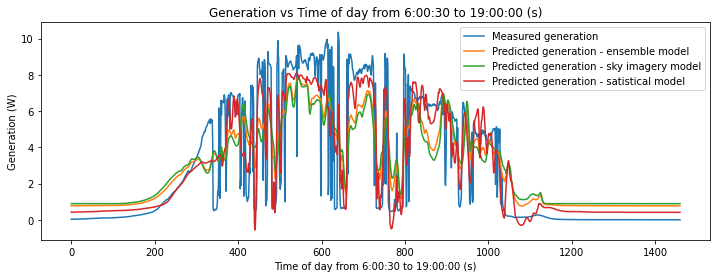

1.6632133592940699 26.0


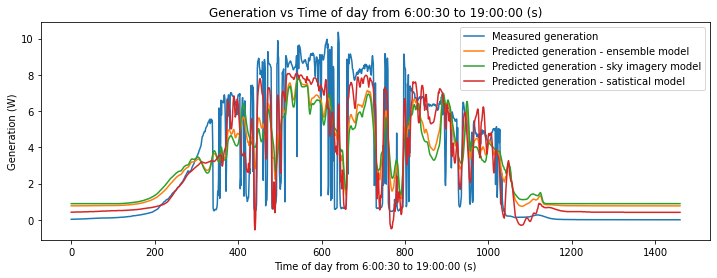

1.655062504808184 27.0


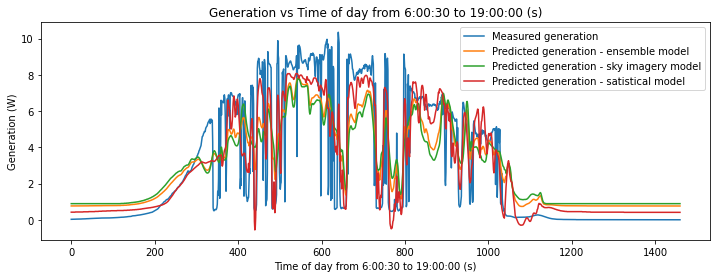

1.6469621901865596 28.000000000000004


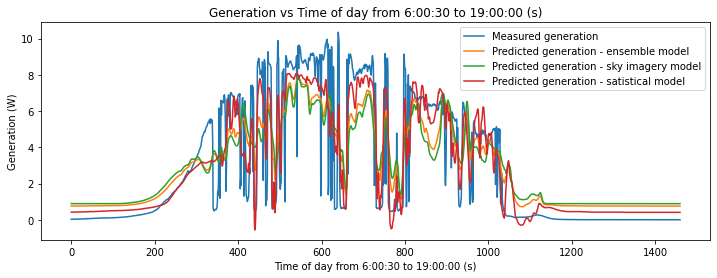

1.6389131648079558 28.999999999999996


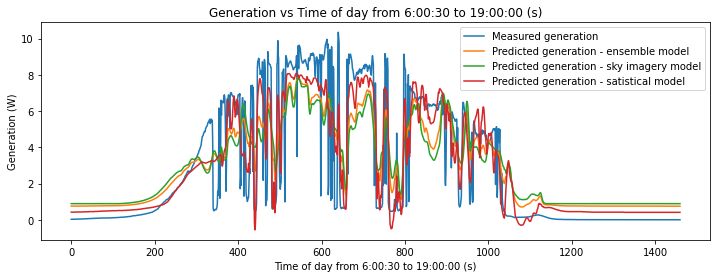

1.6309161880526148 30.0


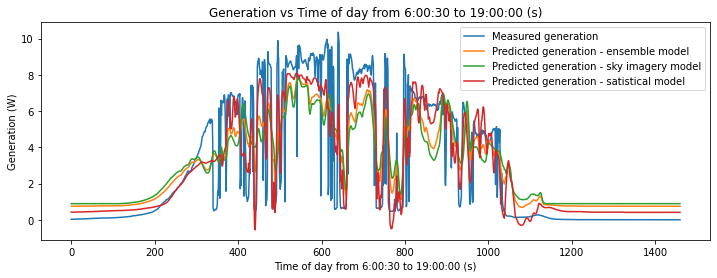

1.6229720293085215 31.0


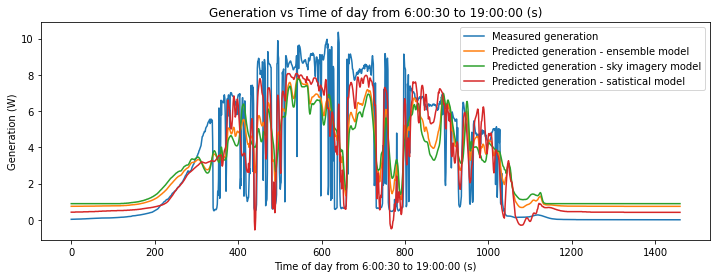

1.6150814679693721 32.0


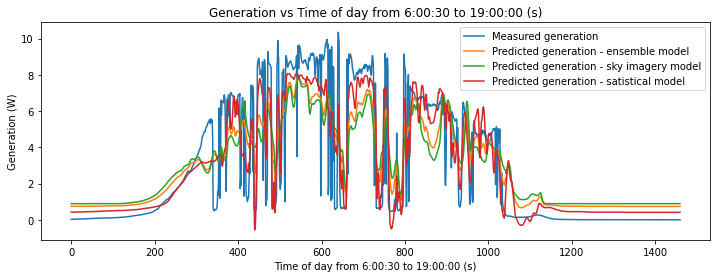

1.607245293423775 33.0


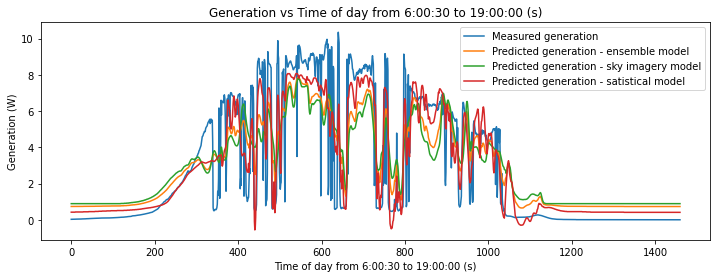

1.5994643050353377 34.0


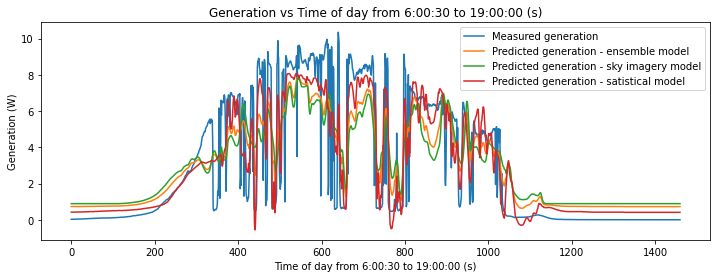

1.5917393121130226 35.0


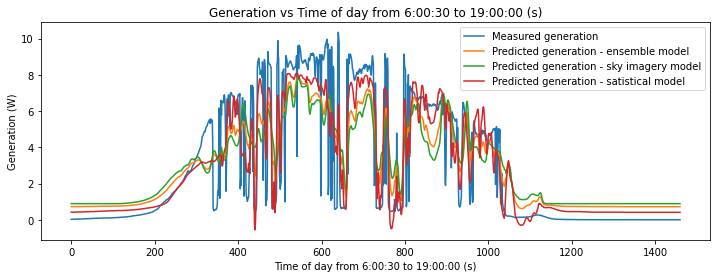

1.5840711338713211 36.0


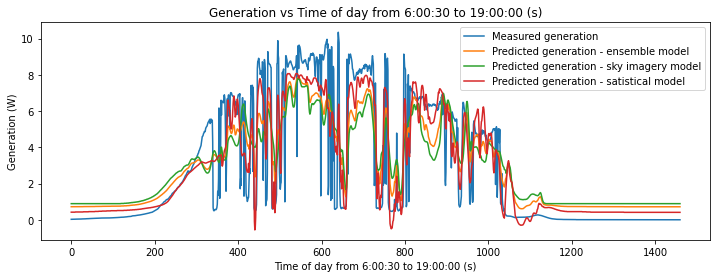

1.5764605993799066 37.0


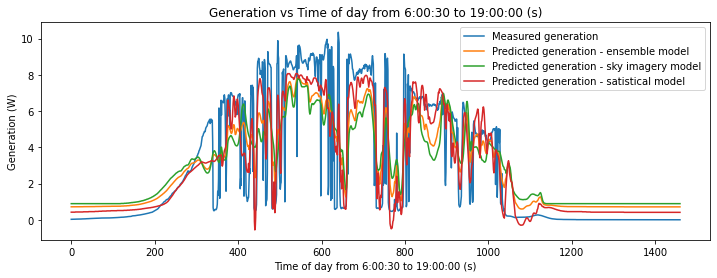

1.5689085475019475 38.0


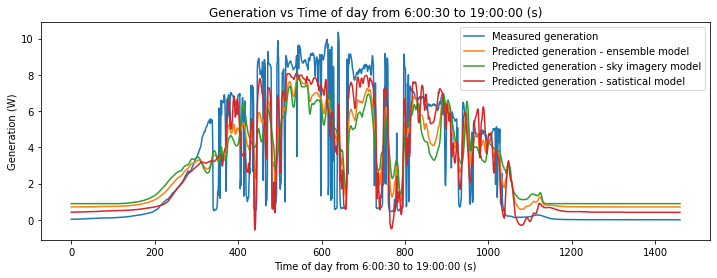

1.5614158268208287 39.0


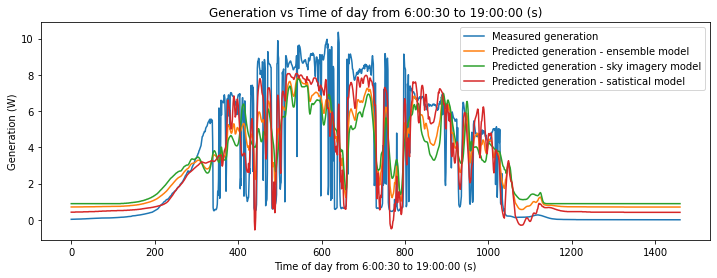

1.5539832955546957 40.0


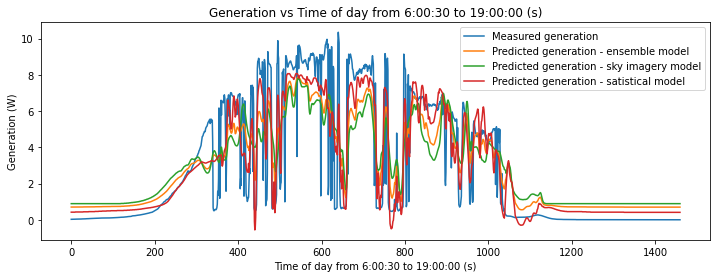

1.5466118214581115 41.0


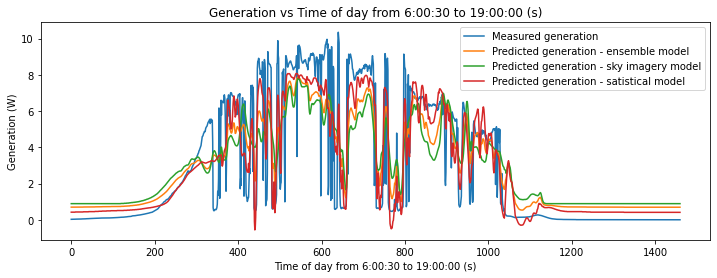

1.5393022817105952 42.0


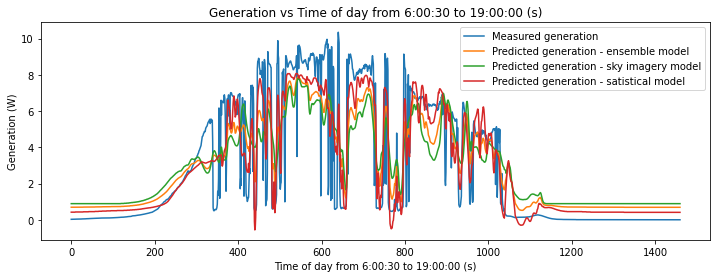

1.5320555627911983 43.0


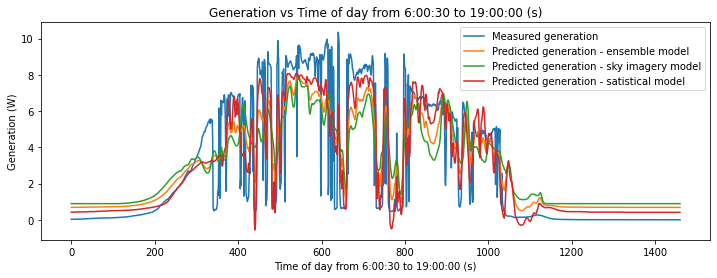

1.5248725603387216 44.0


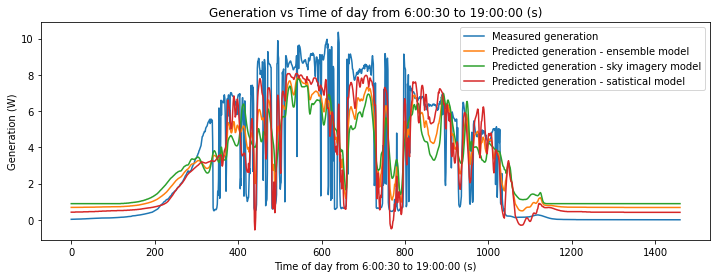

1.5177541789970554 45.0


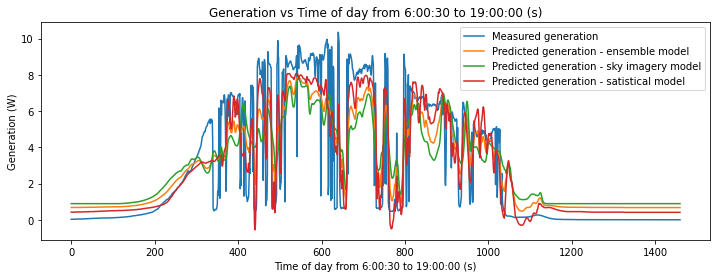

1.5107013322449159 46.0


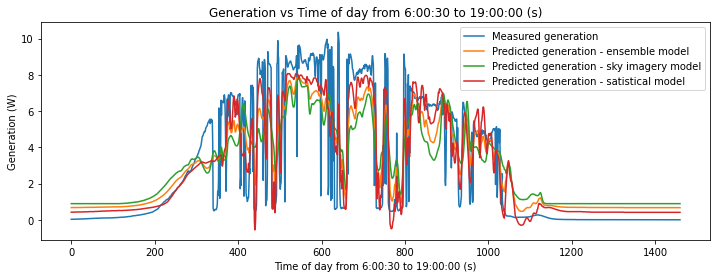

1.5037149422096752 47.0


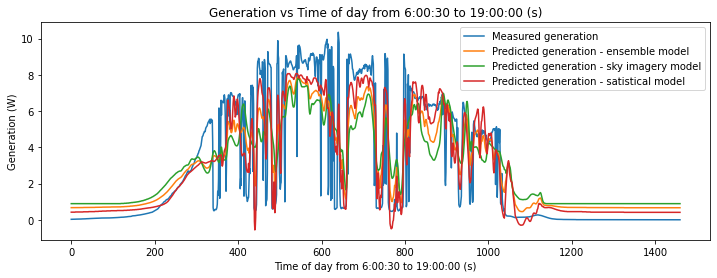

1.4967959394644506 48.0


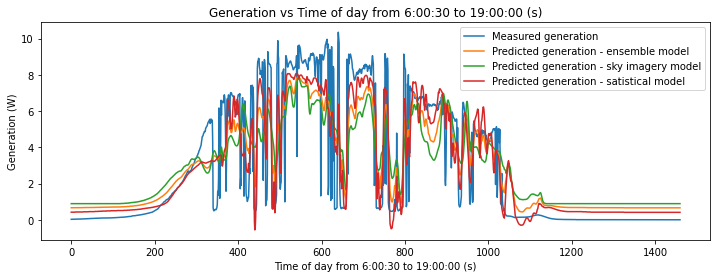

1.4899452628081238 49.0


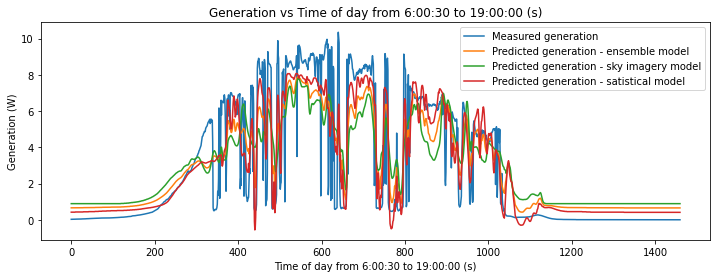

1.4831638590277274 50.0


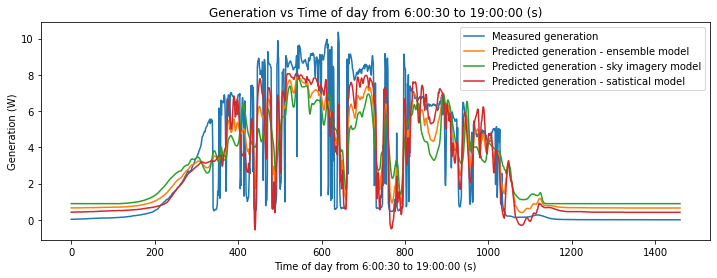

1.4764526826424873 51.0


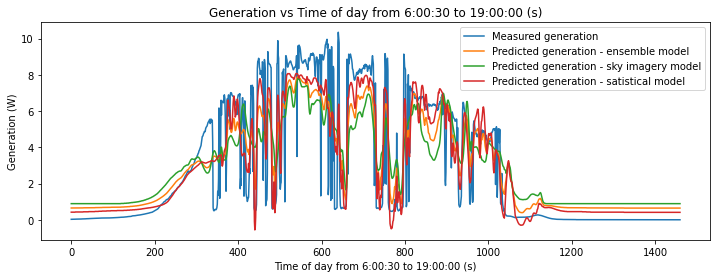

1.4698126956292346 52.0


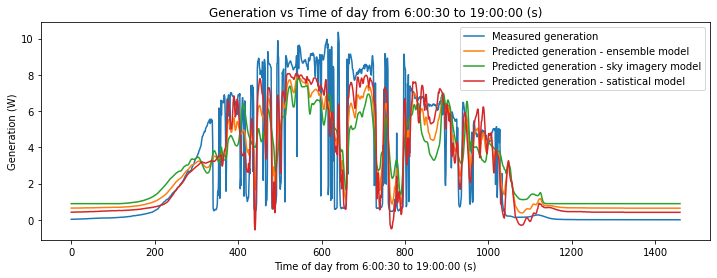

1.4632448671285656 53.0


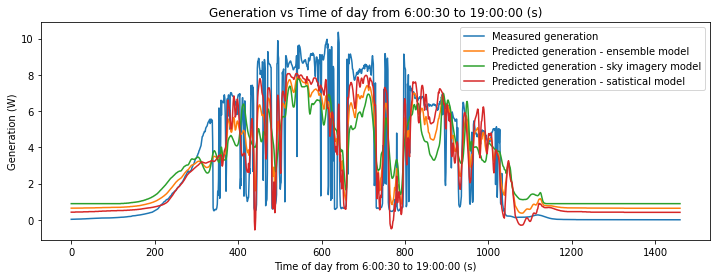

1.456750173131211 54.0


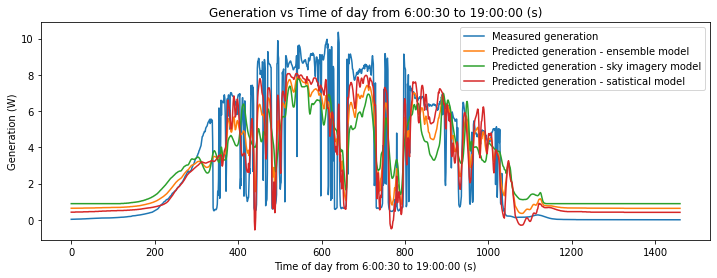

1.45032959614429 55.00000000000001


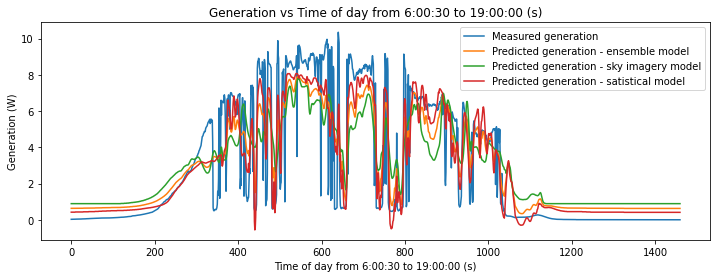

1.443984124836848 56.00000000000001


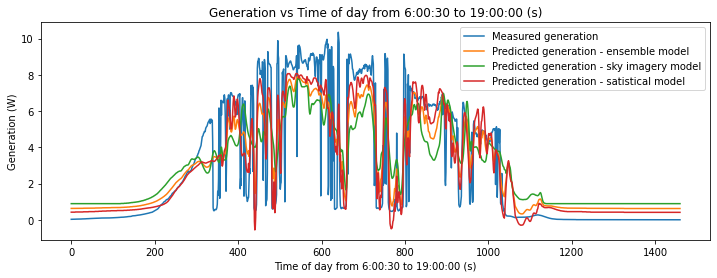

1.4377147536643407 56.99999999999999


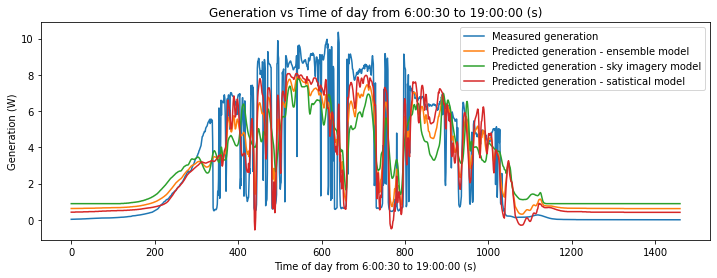

1.431522482471694 57.99999999999999


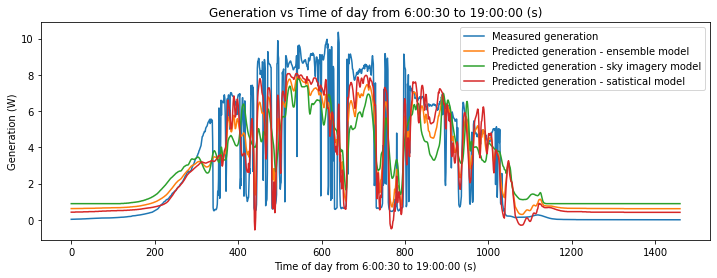

1.4254083160744642 59.0


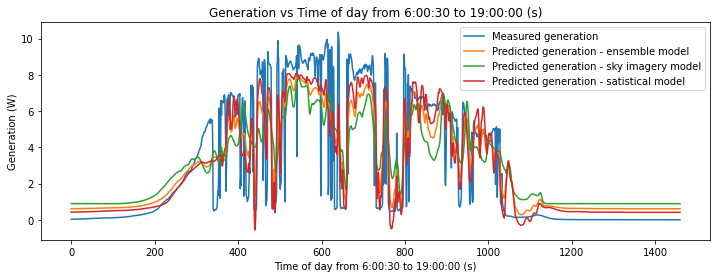

1.4193732638179037 60.0


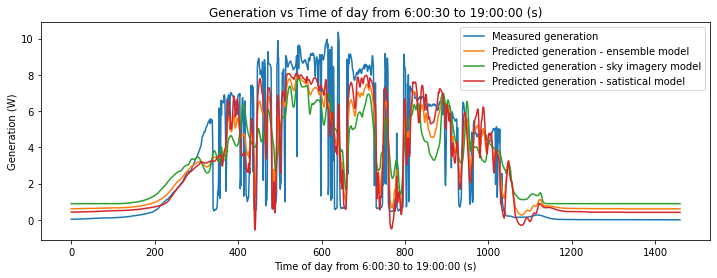

1.413418339113532 61.0


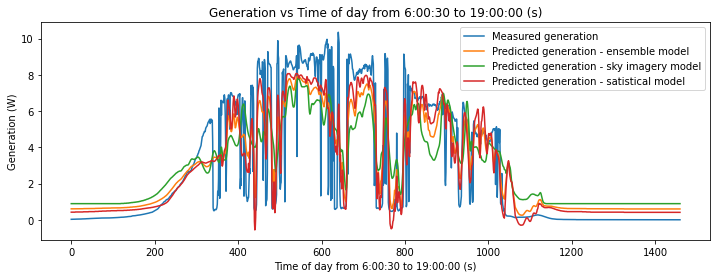

1.40754455895305 62.0


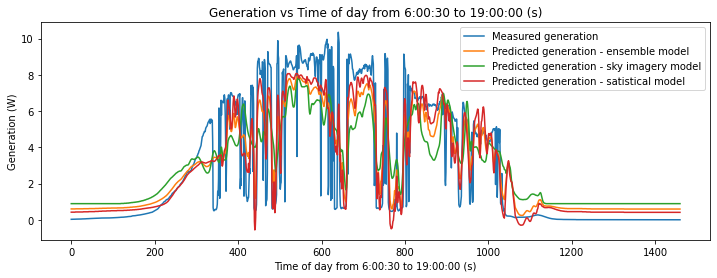

1.4017529433993552 63.0


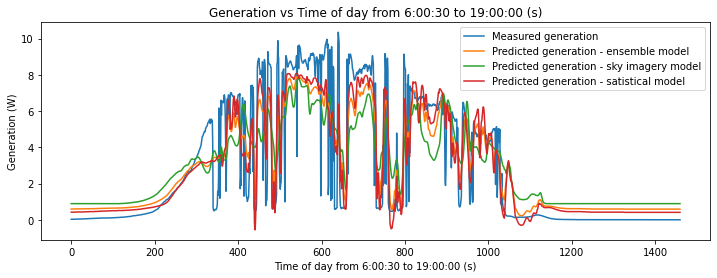

1.3960445150544802 64.0


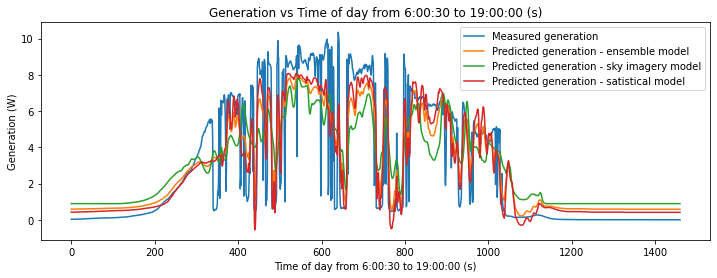

1.3904202985044298 65.0


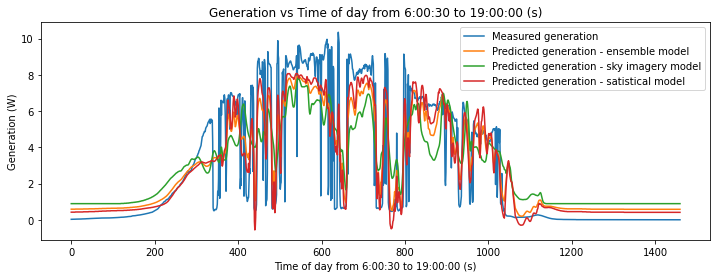

1.3848813197408416 66.0


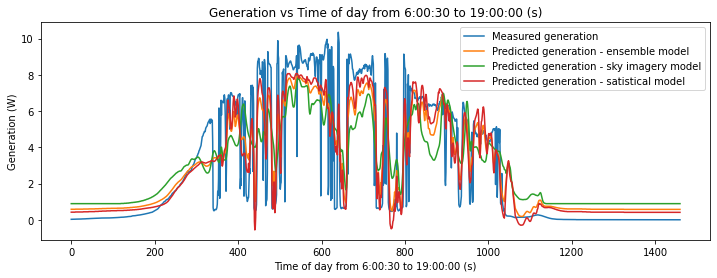

1.3794286055594227 67.0


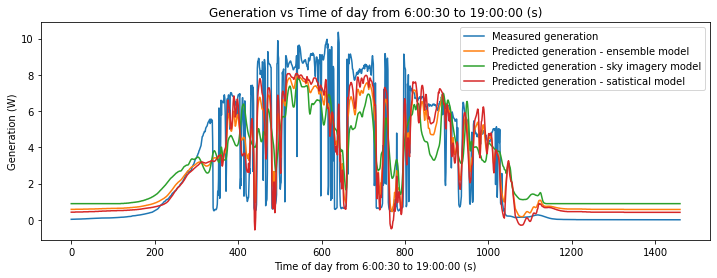

1.3740631829354188 68.0


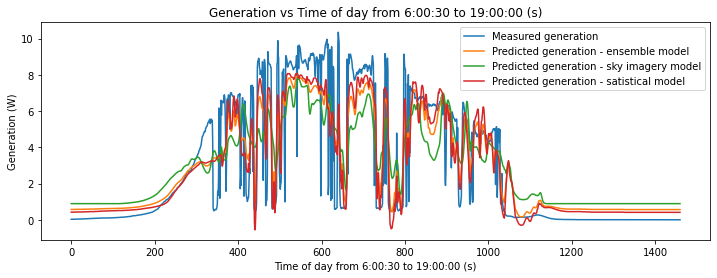

1.3687860783760766 69.0


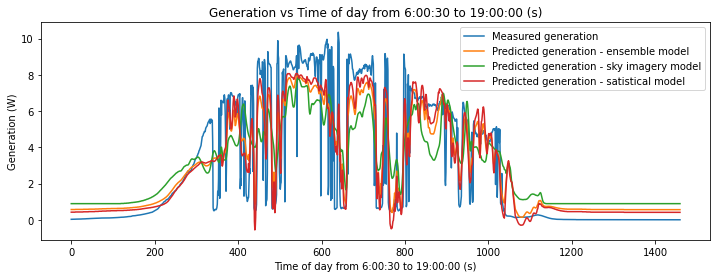

1.3635983172504353 70.0


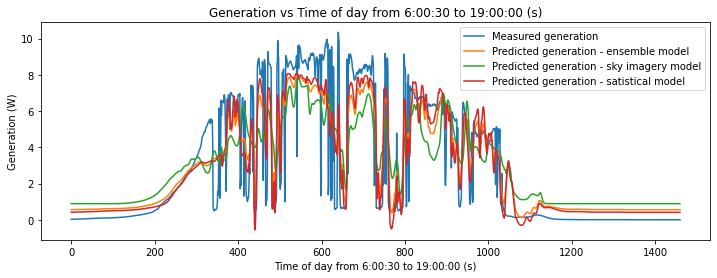

1.3585009230967797 71.0


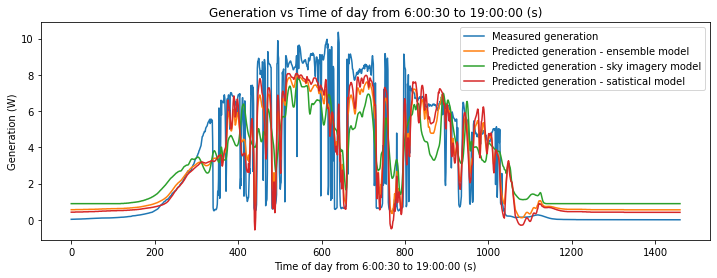

1.3534949169080297 72.0


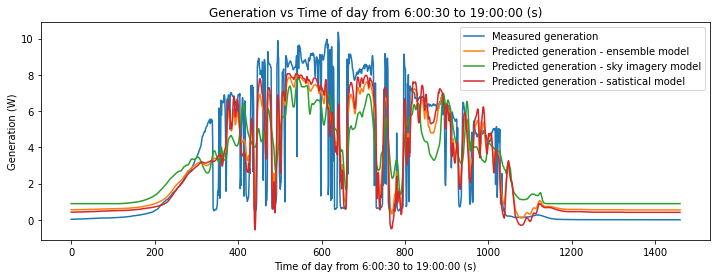

1.3485813163956886 73.0


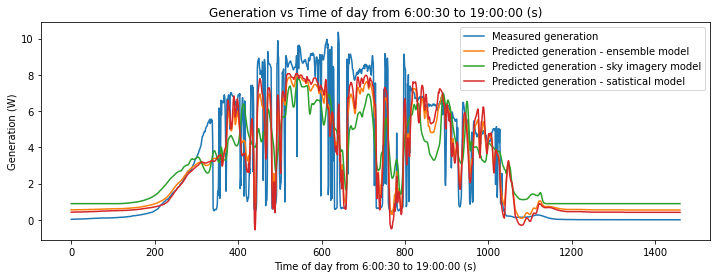

1.343761135232614 74.0


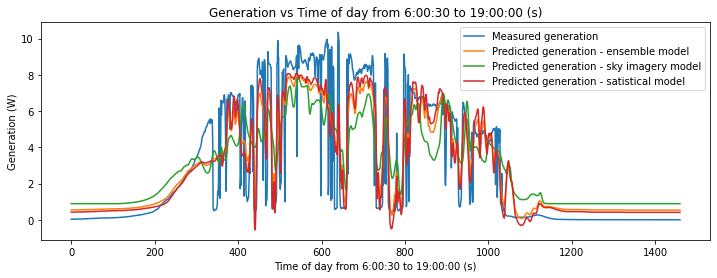

1.3390353822757368 75.0


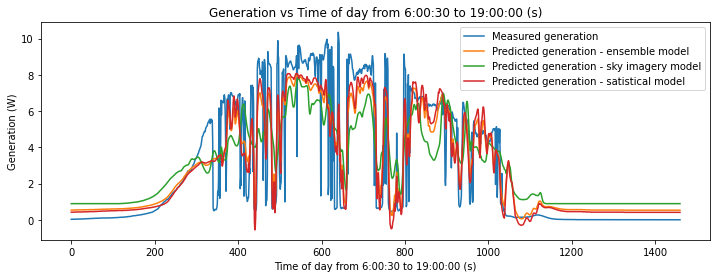

1.3344050607688425 76.0


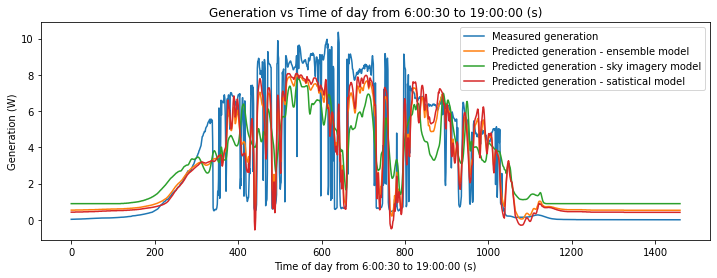

1.3298711675268313 77.0


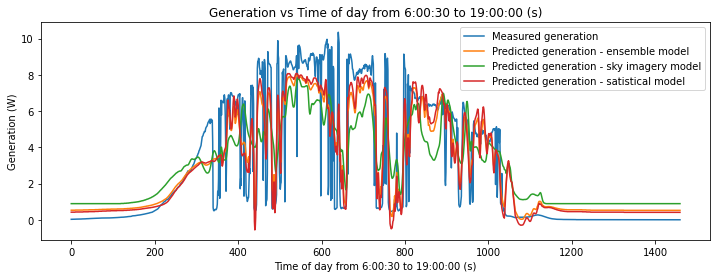

1.3254346921019489 78.0


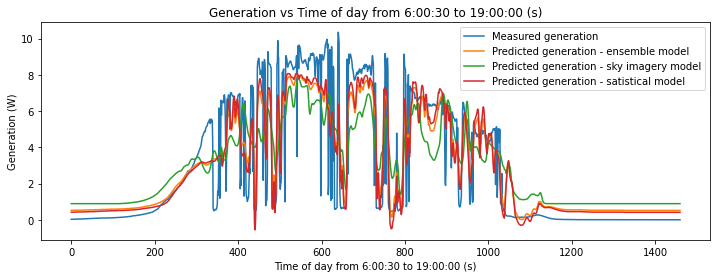

1.3210966159331938 79.0


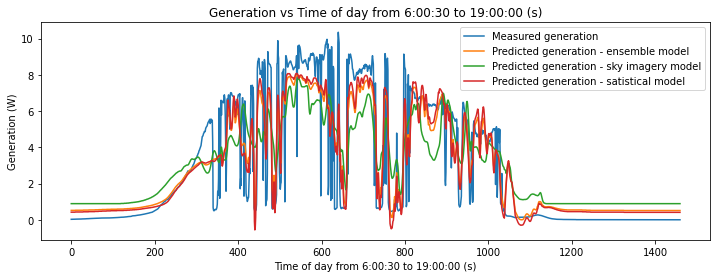

1.316857911479967 80.0


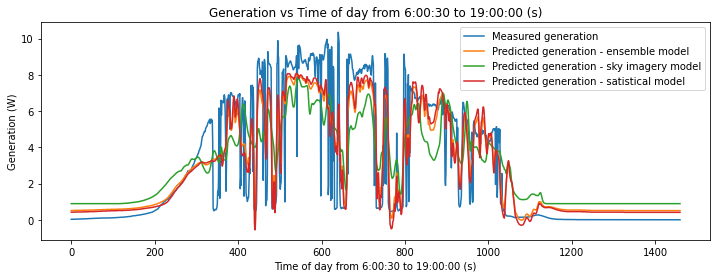

1.3127195413412556 81.0


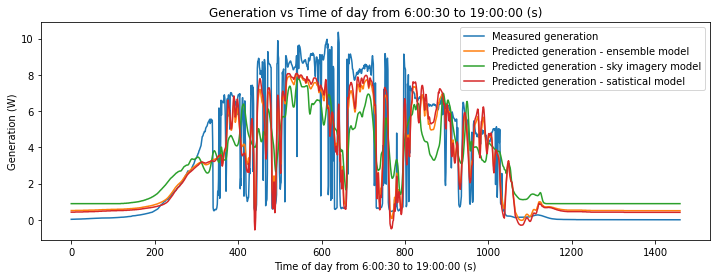

1.3086824573614015 82.0


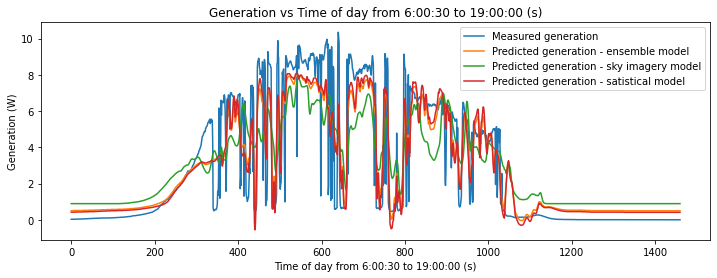

1.3047475997242899 83.0


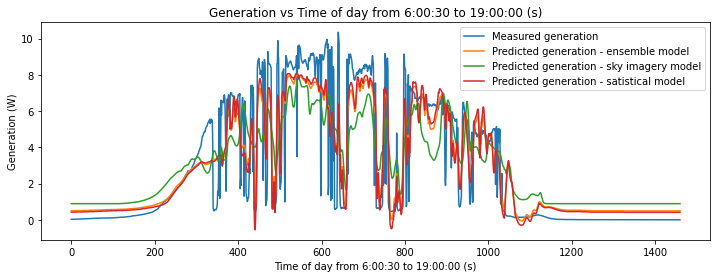

1.3009158960369551 84.0


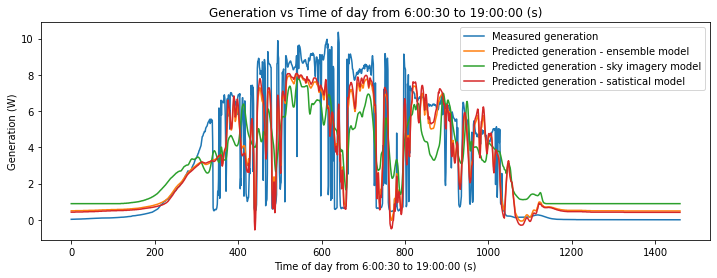

1.297188260404601 85.0


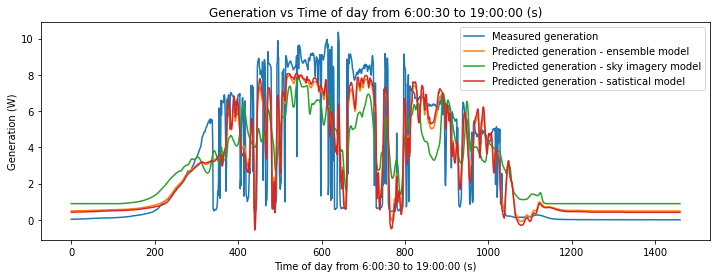

1.2935655924984595 86.0


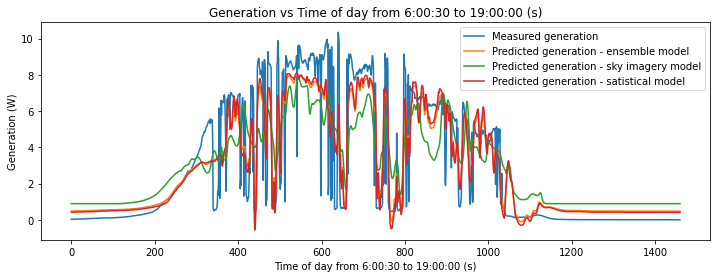

1.2900487766184665 87.0


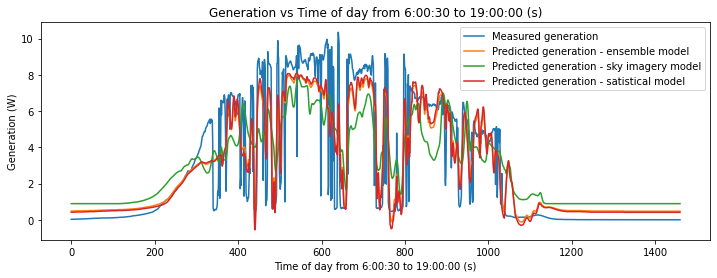

1.2866386807523775 88.0


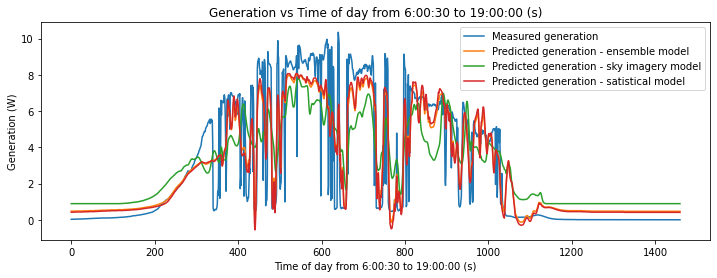

1.2833361556334997 89.0


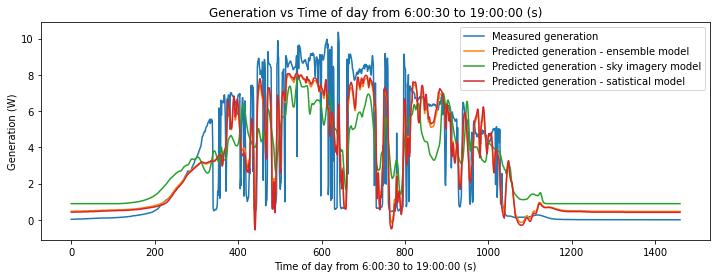

1.2801420337988336 90.0


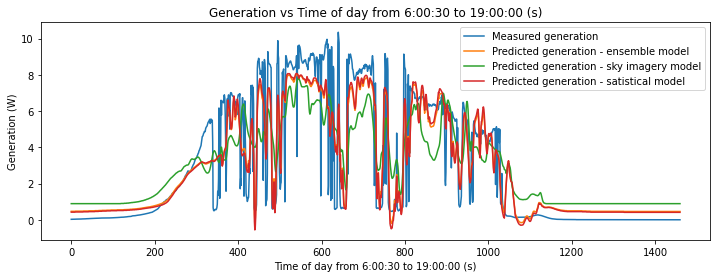

1.2770571286499375 91.0


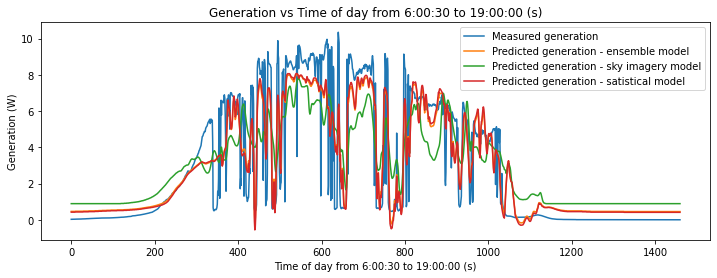

1.2740822335183495 92.0


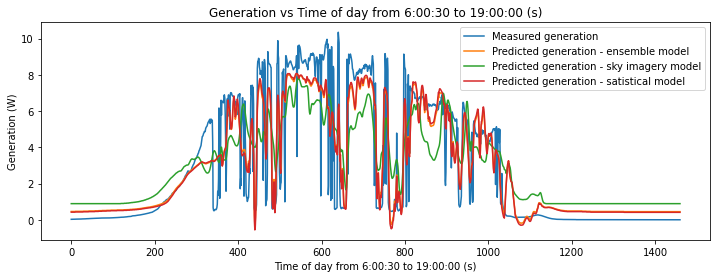

1.271218120738199 93.0


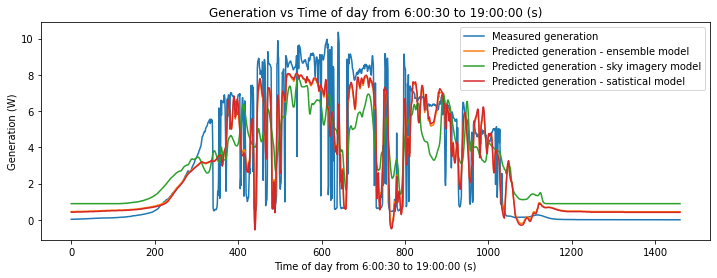

1.26846554072773 94.0


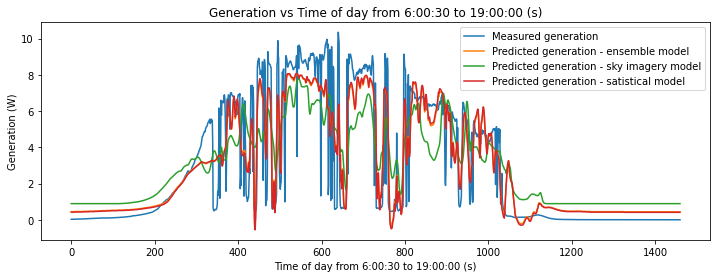

1.2658252210825776 95.0


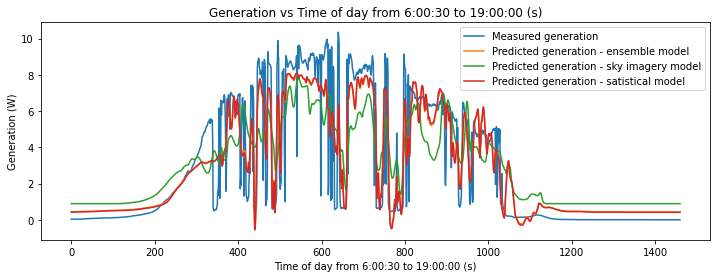

1.2632978656826606 96.0


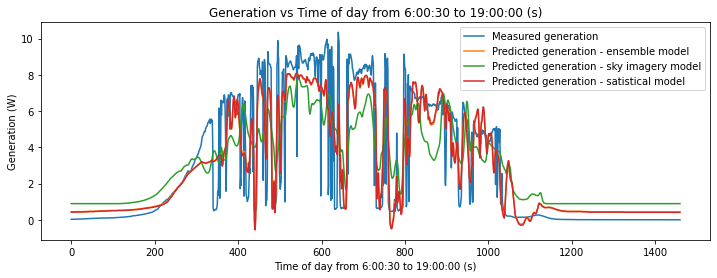

1.2608841538152786 97.0


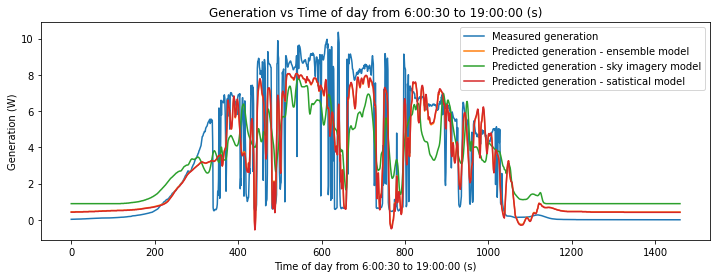

1.258584739316786 98.0


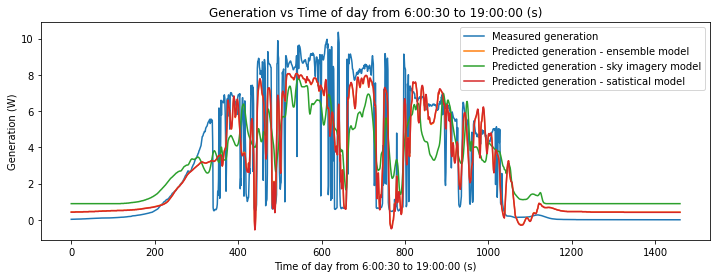

1.2564002497350288 99.0


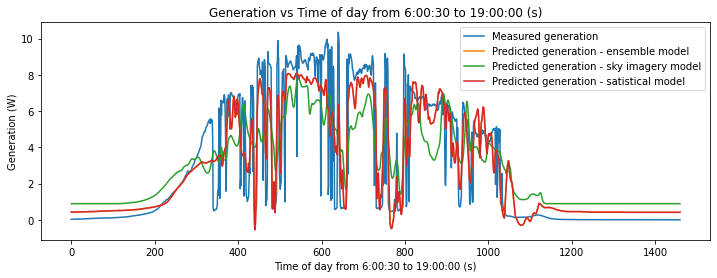

IndexError: ignored

In [ ]:
count = 0
for ensemble1 in ensemble:
  plt.figure(figsize=(12,4))
  #
  plt.plot( list(Expected1))
  plt.plot(ensemble1)
  plt.plot(predn)
  plt.plot(predn1)
  plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
  plt.ylabel("Generation (W)")
  plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
  plt.legend(('Measured generation','Predicted generation - ensemble model', 'Predicted generation - sky imagery model', 'Predicted generation - satistical model'))
  plt.show()
  print(RMSE[count], weights_list[count])
  count +=1

In [ ]:
weights_list = list(range(0,100,1))

99 100


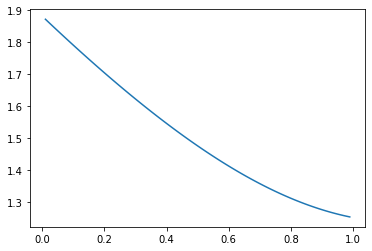

In [ ]:

weights_list = list(map(lambda x: x/100,weights_list))[1:]
print(len(weights_list),len(RMSE))
plt.plot( weights_list,RMSE[1:])
# plt.plot()

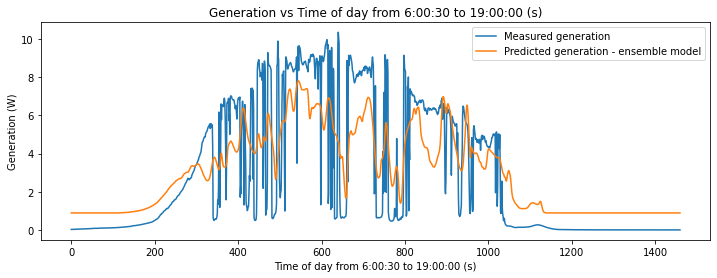

1.8814184355325174 0.01


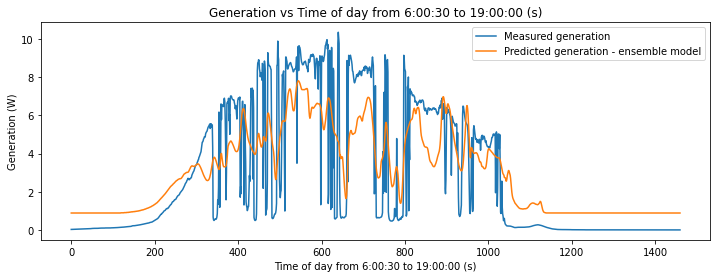

1.8722192515798817 0.02


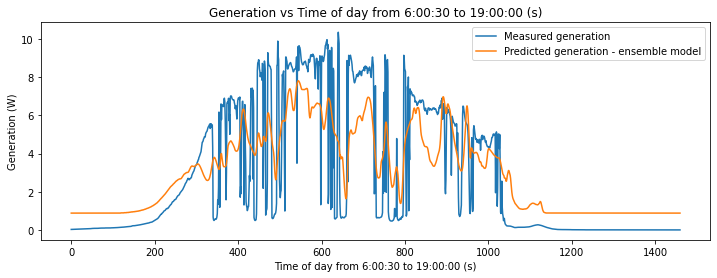

1.8630549823356084 0.03


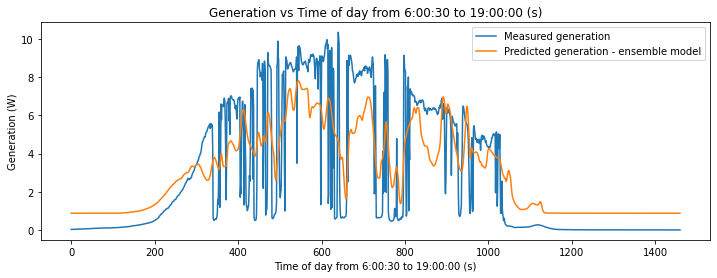

1.8539261455676013 0.04


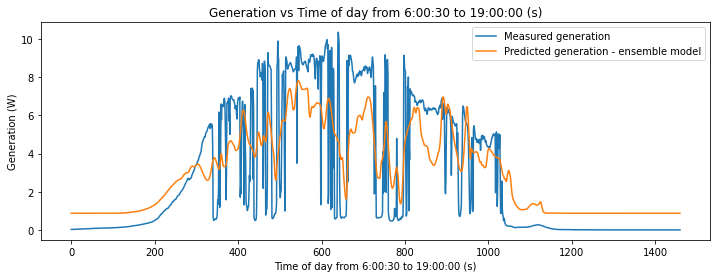

1.8448332672703474 0.05


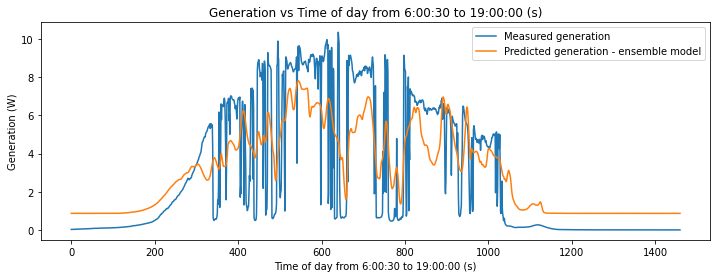

1.8357768817669786 0.06


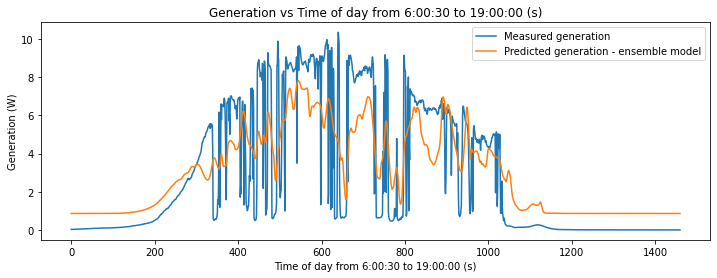

1.826757531810783 0.07


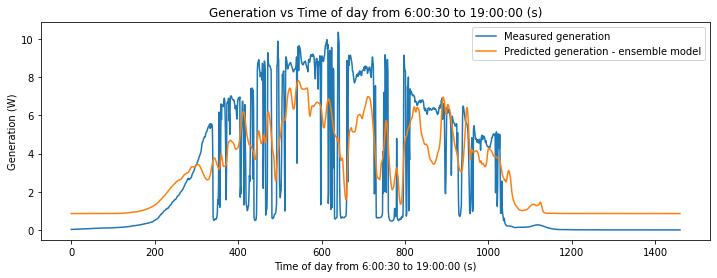

1.8177757686852323 0.08


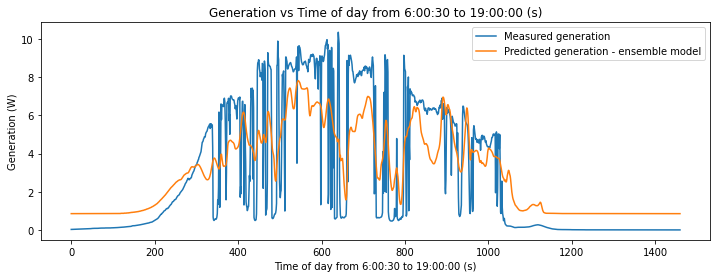

1.8088321523030861 0.09


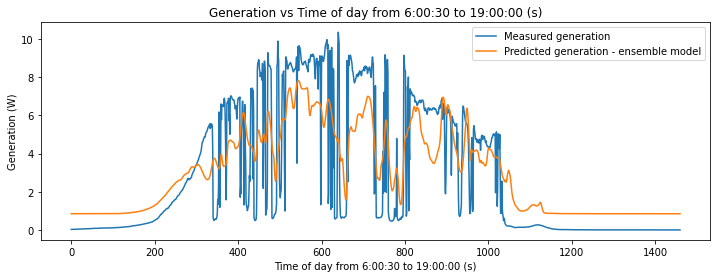

1.7999272513038624 0.1


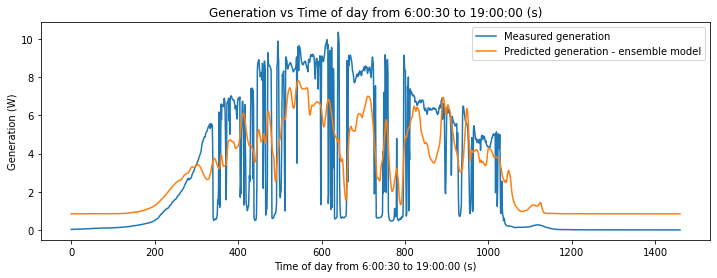

1.7910616431495872 0.11


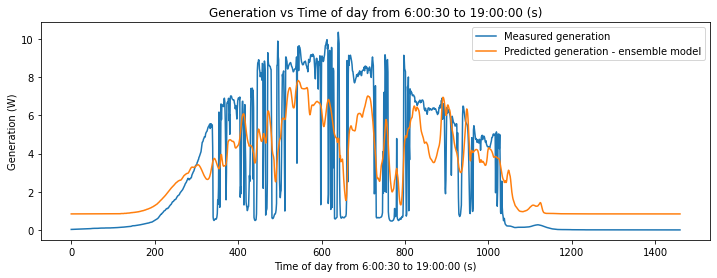

1.7822359142188526 0.12


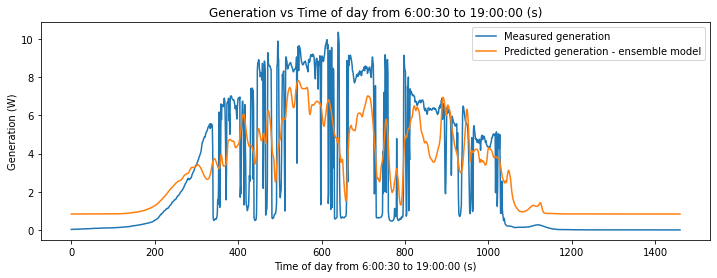

1.773450659898913 0.13


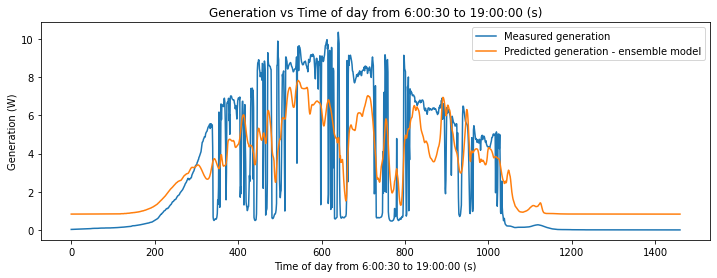

1.764706484675235 0.14


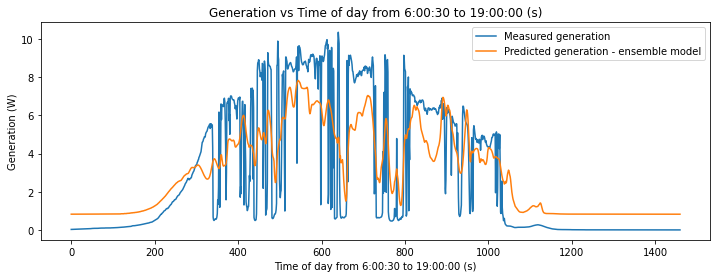

1.7560040022187282 0.15


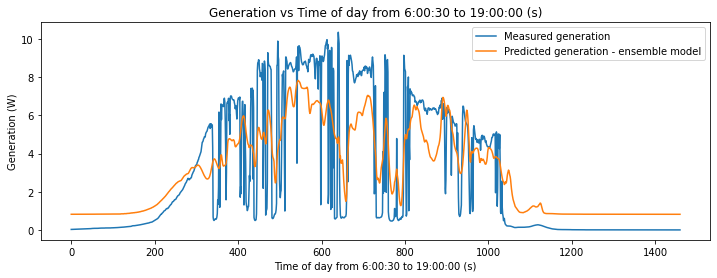

1.747343835470332 0.16


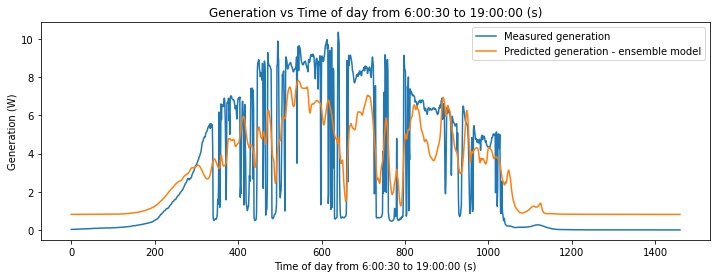

1.738726616722311 0.17


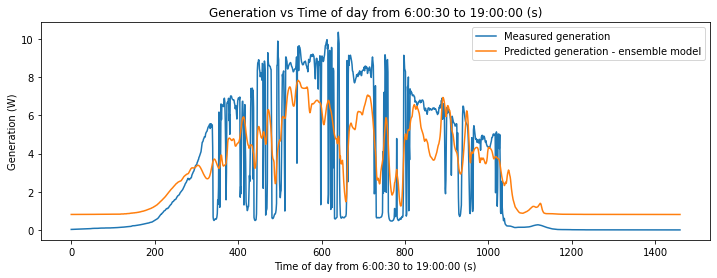

1.7301529876966308 0.18


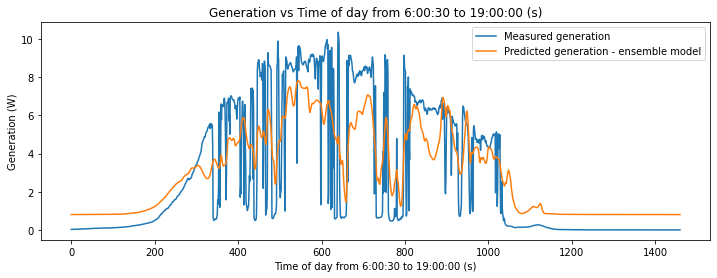

1.7216235996195903 0.19


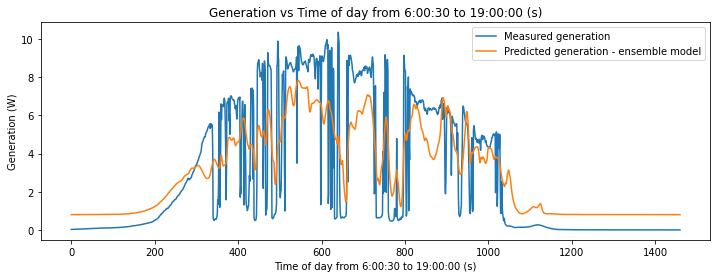

1.713139113292657 0.2


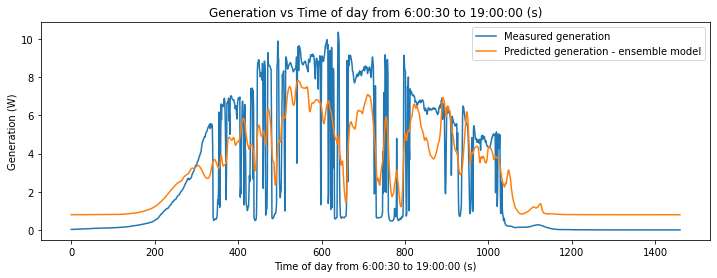

1.7047001991592916 0.21


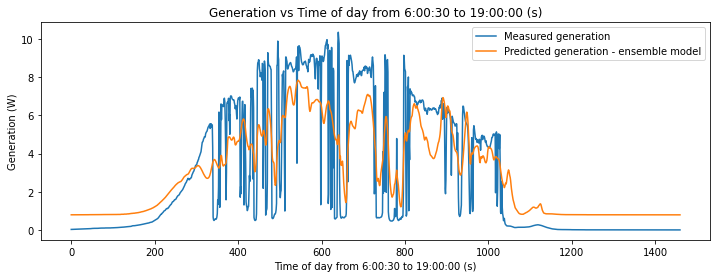

1.696307537367198 0.22


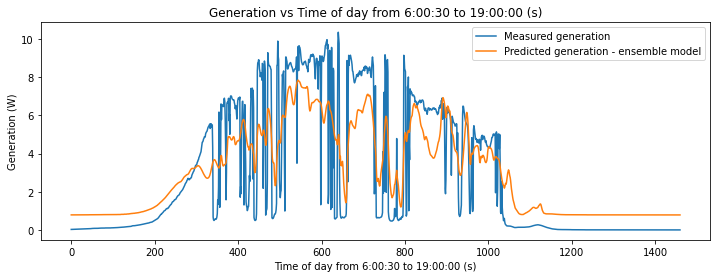

1.6879618178259723 0.23


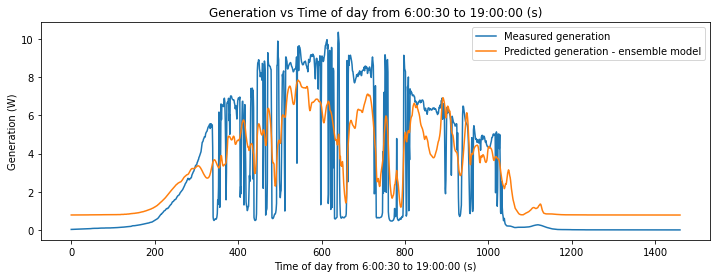

1.6796637402594778 0.24


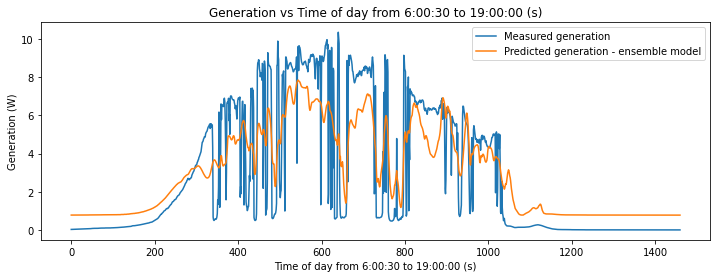

1.671414014252936 0.25


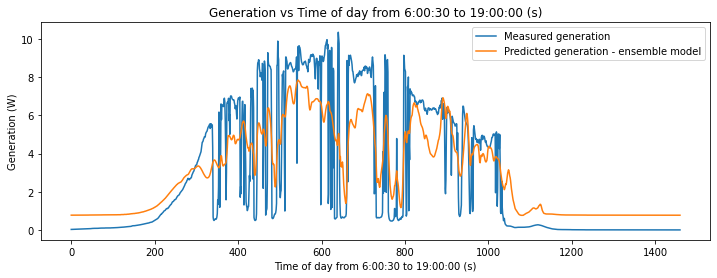

1.6632133592940699 0.26


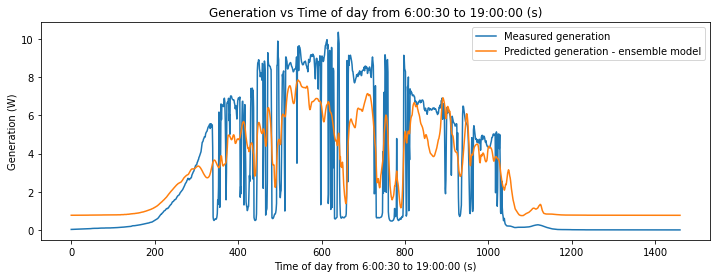

1.655062504808184 0.27


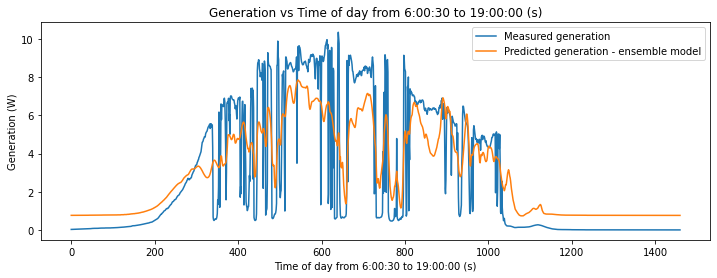

1.6469621901865596 0.28


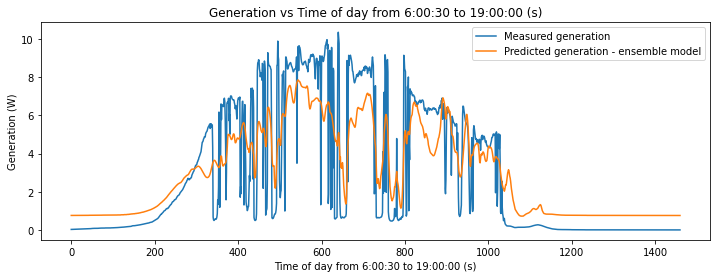

1.6389131648079558 0.29


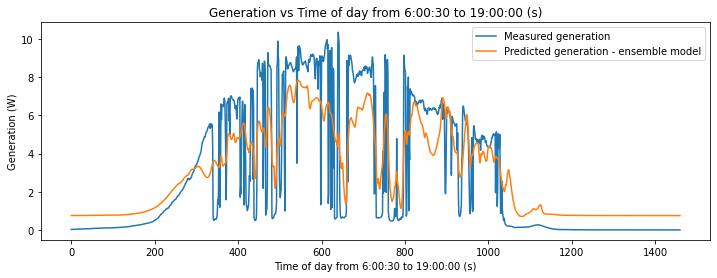

1.6309161880526148 0.3


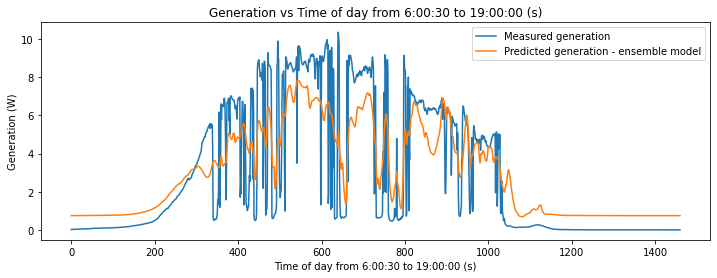

1.6229720293085215 0.31


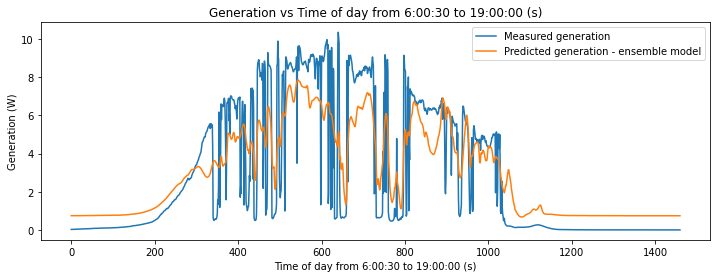

1.6150814679693721 0.32


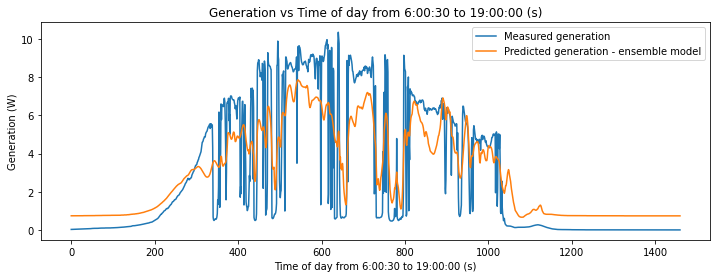

1.607245293423775 0.33


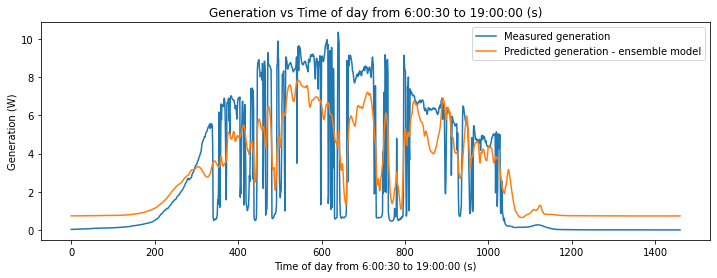

1.5994643050353377 0.34


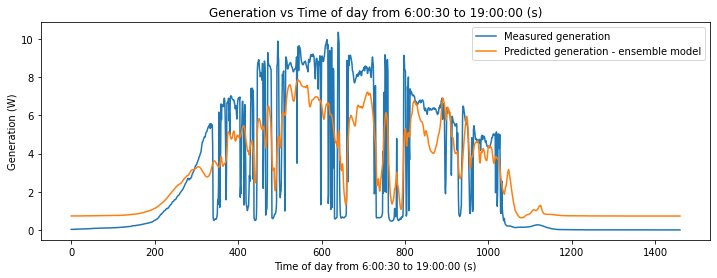

1.5917393121130226 0.35


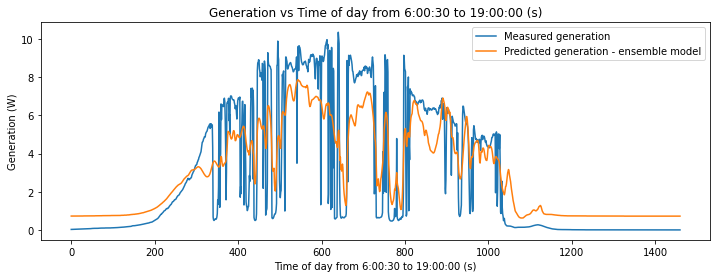

1.5840711338713211 0.36


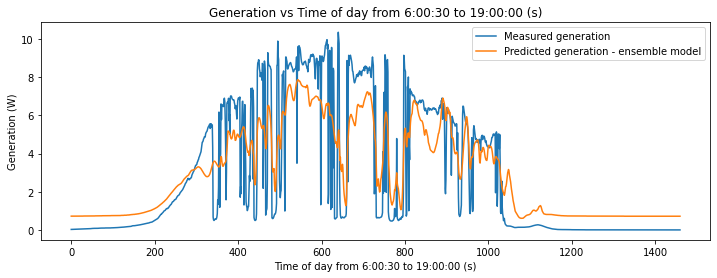

1.5764605993799066 0.37


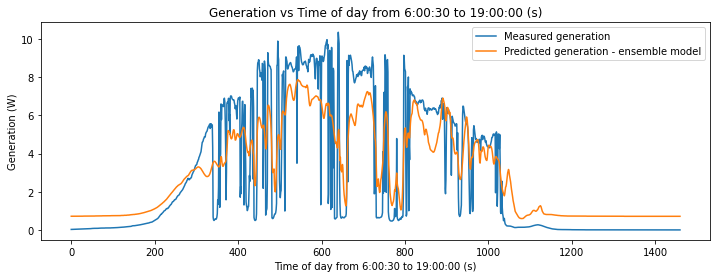

1.5689085475019475 0.38


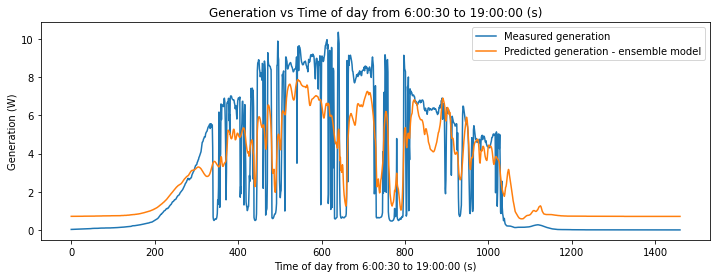

1.5614158268208287 0.39


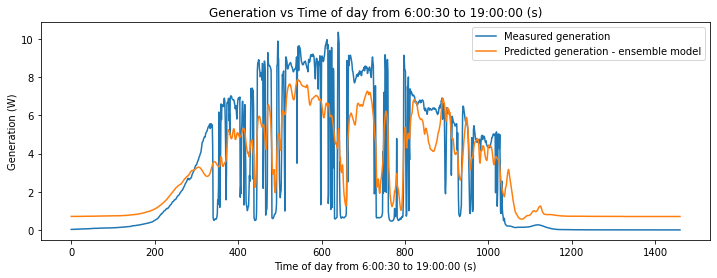

1.5539832955546957 0.4


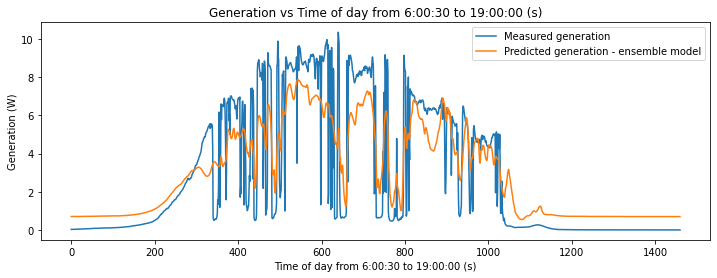

1.5466118214581115 0.41


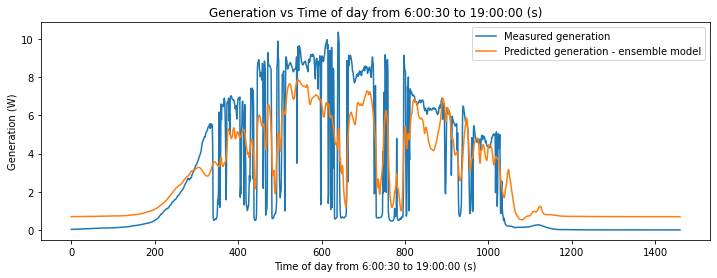

1.5393022817105952 0.42


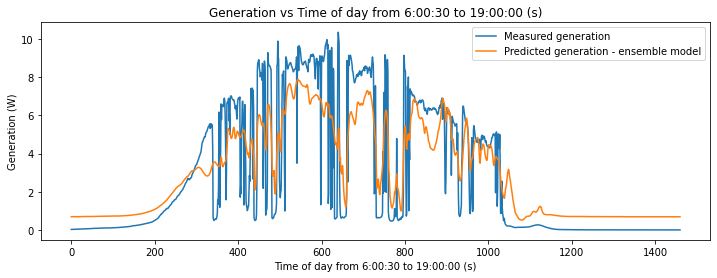

1.5320555627911983 0.43


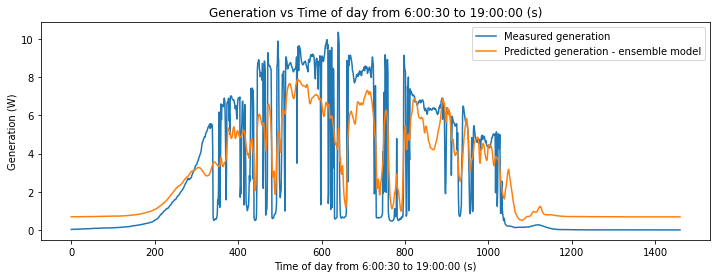

1.5248725603387216 0.44


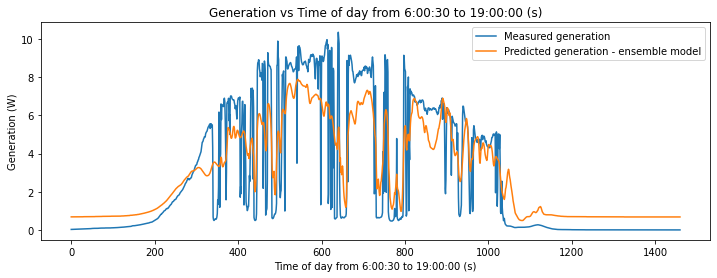

1.5177541789970554 0.45


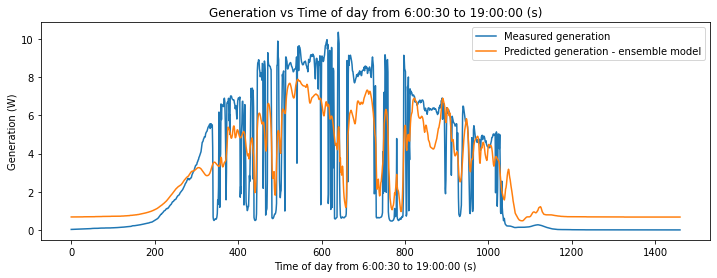

1.5107013322449159 0.46


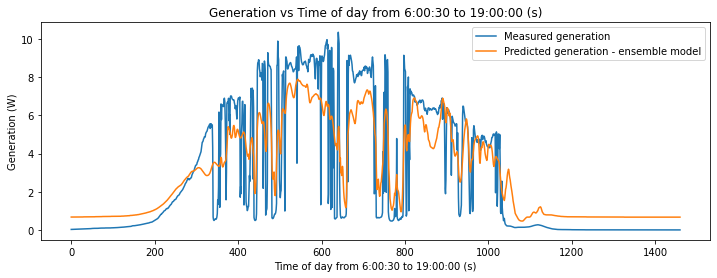

1.5037149422096752 0.47


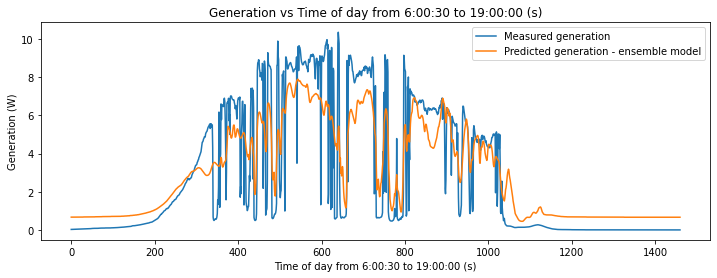

1.4967959394644506 0.48


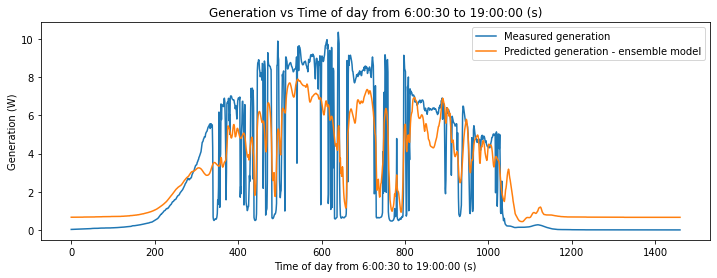

1.4899452628081238 0.49


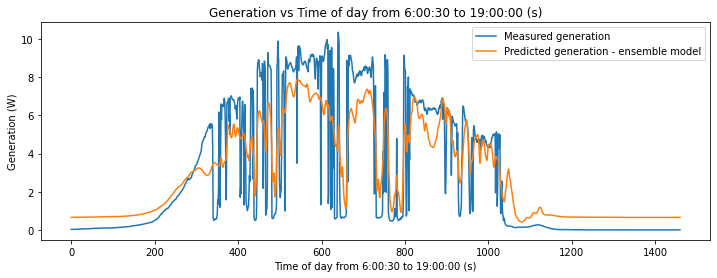

1.4831638590277274 0.5


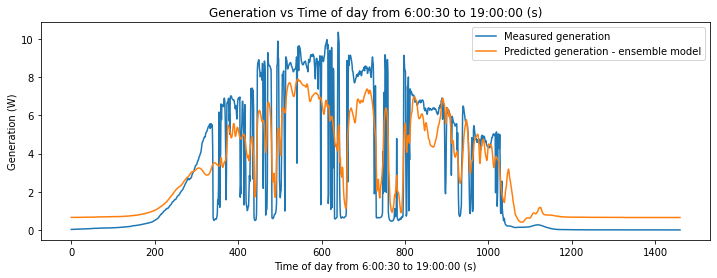

1.4764526826424873 0.51


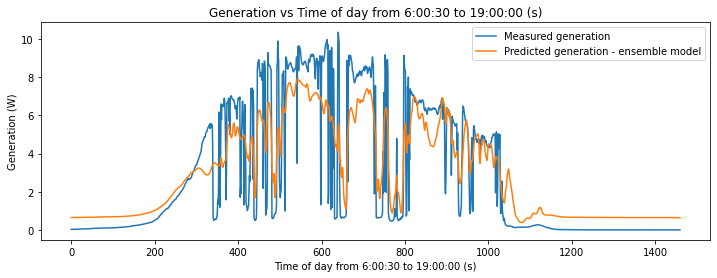

1.4698126956292346 0.52


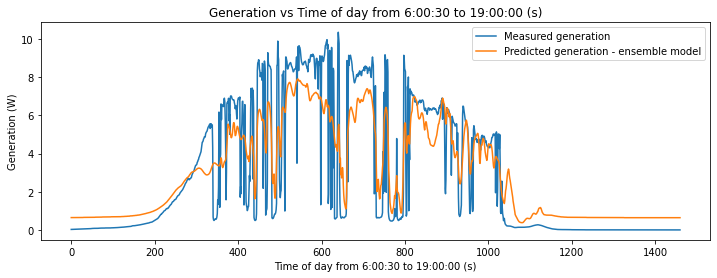

1.4632448671285656 0.53


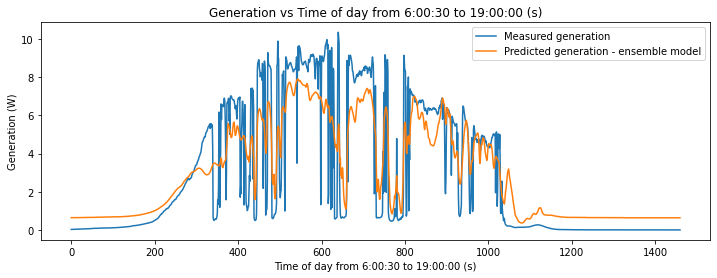

1.456750173131211 0.54


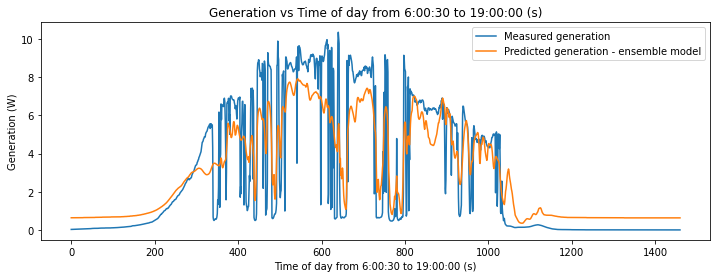

1.45032959614429 0.55


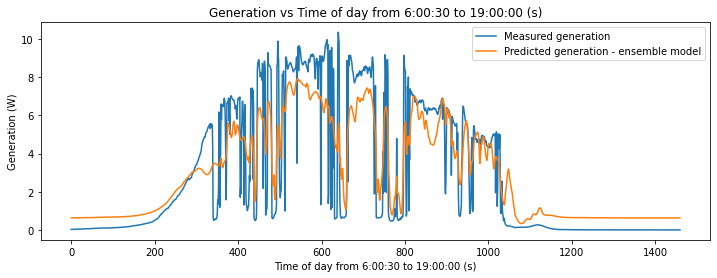

1.443984124836848 0.56


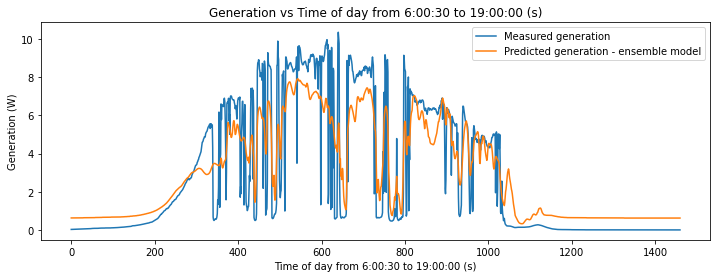

1.4377147536643407 0.57


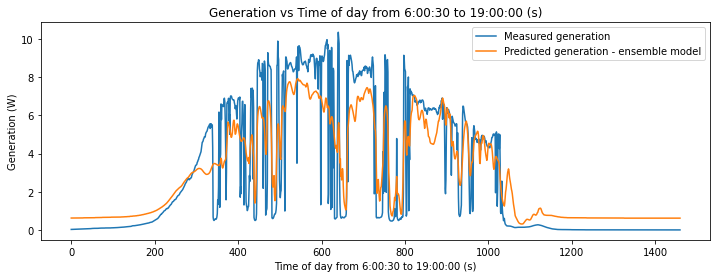

1.431522482471694 0.58


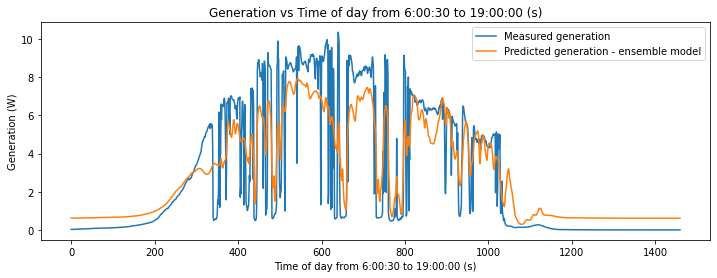

1.4254083160744642 0.59


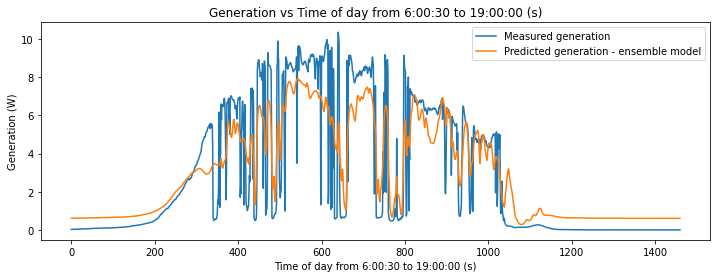

1.4193732638179037 0.6


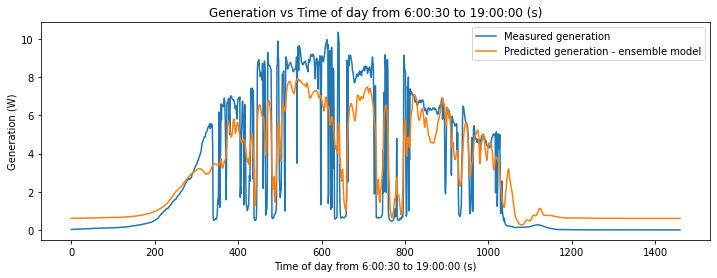

1.413418339113532 0.61


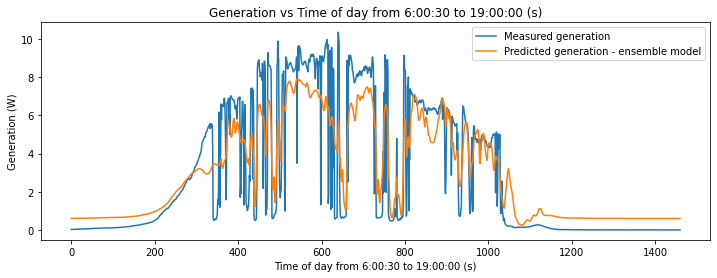

1.40754455895305 0.62


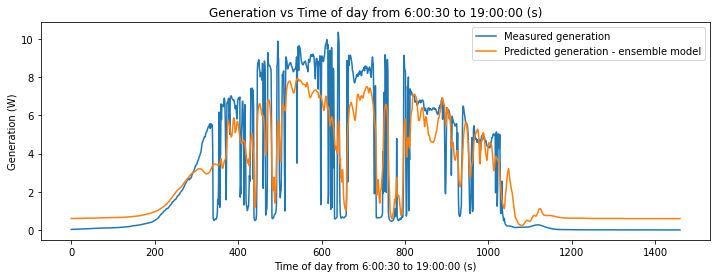

1.4017529433993552 0.63


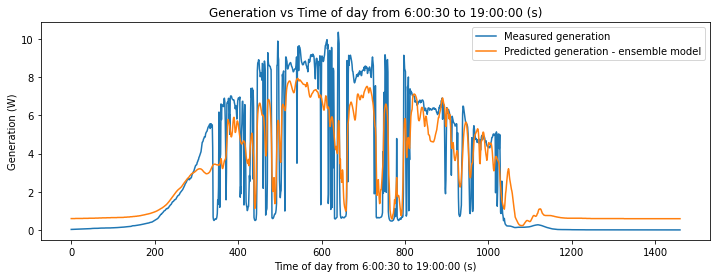

1.3960445150544802 0.64


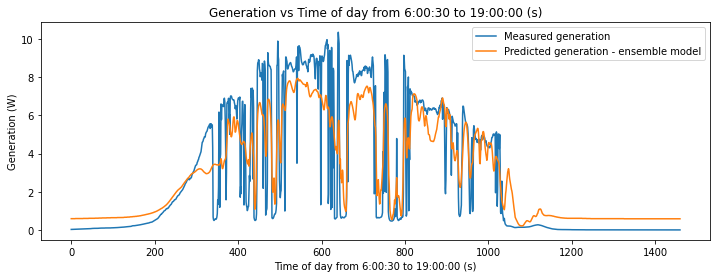

1.3904202985044298 0.65


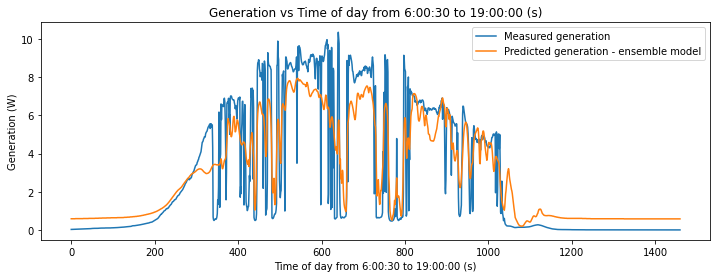

1.3848813197408416 0.66


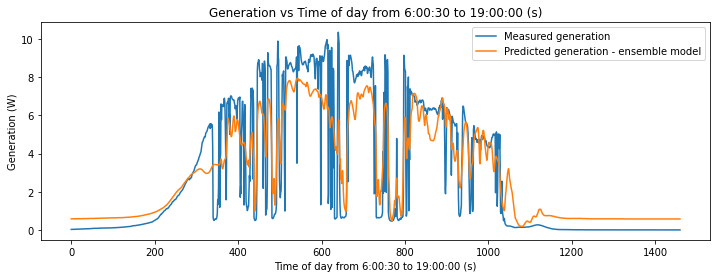

1.3794286055594227 0.67


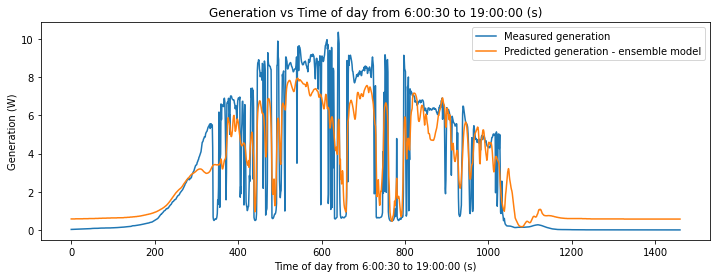

1.3740631829354188 0.68


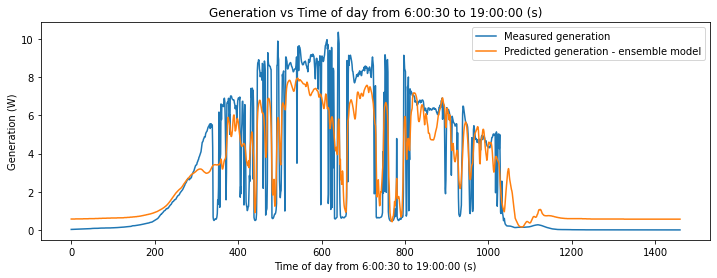

1.3687860783760766 0.69


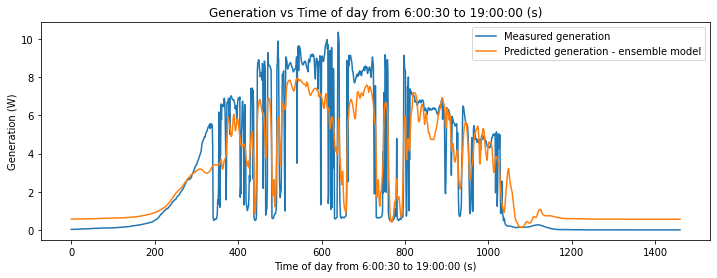

1.3635983172504353 0.7


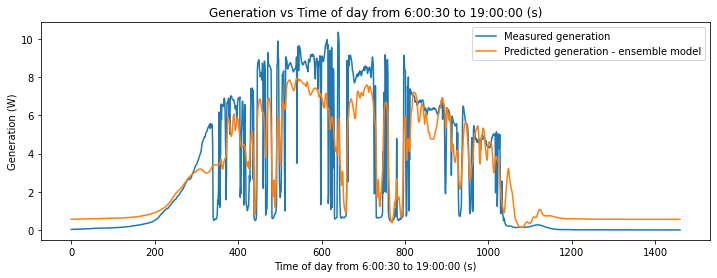

1.3585009230967797 0.71


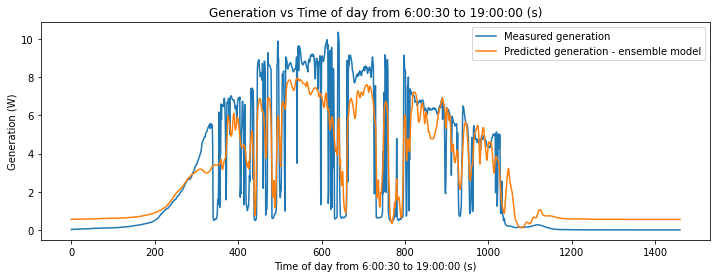

1.3534949169080297 0.72


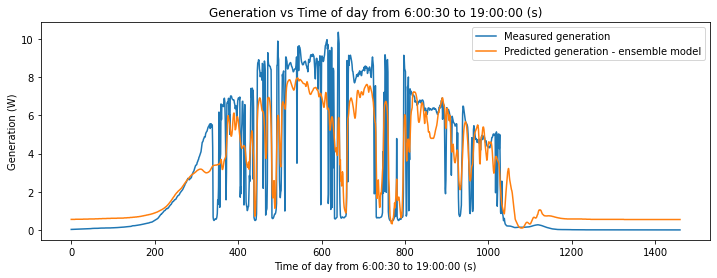

1.3485813163956886 0.73


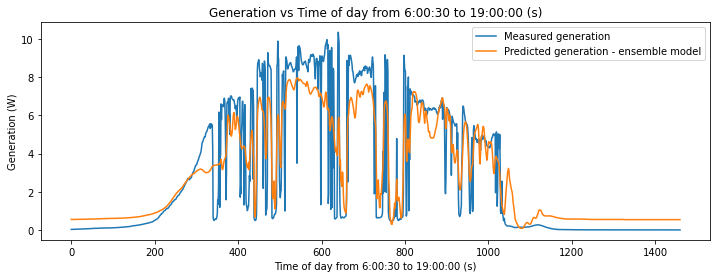

1.343761135232614 0.74


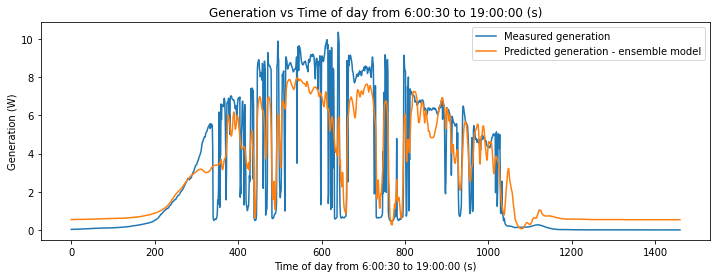

1.3390353822757368 0.75


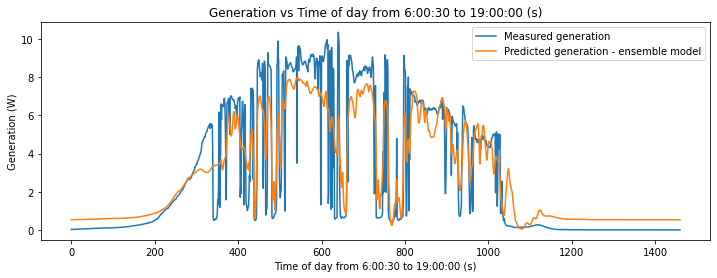

1.3344050607688425 0.76


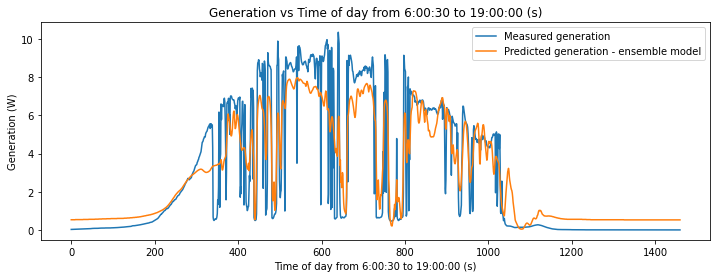

1.3298711675268313 0.77


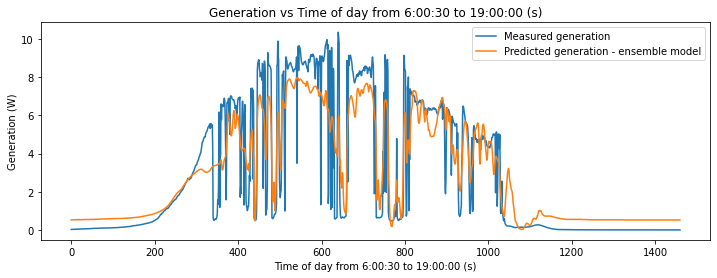

1.3254346921019489 0.78


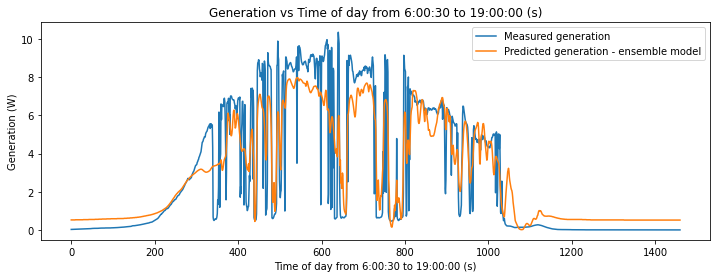

1.3210966159331938 0.79


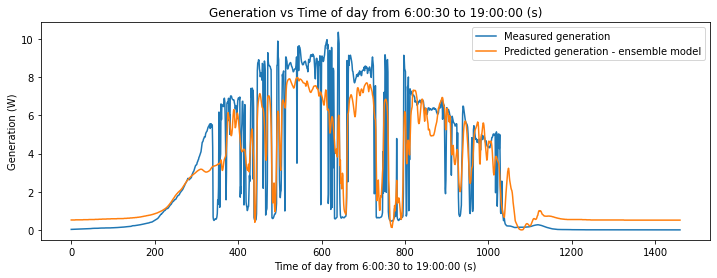

1.316857911479967 0.8


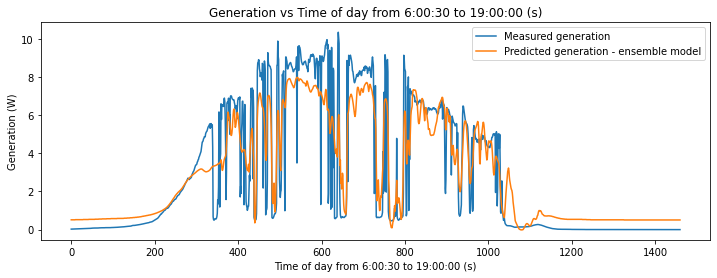

1.3127195413412556 0.81


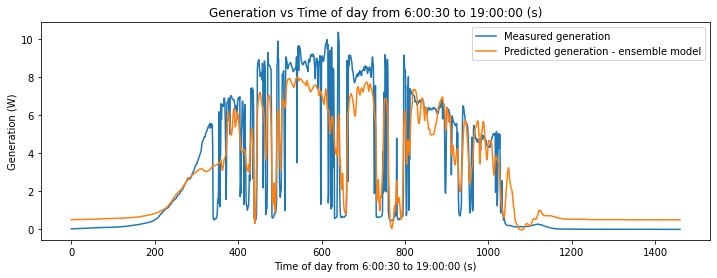

1.3086824573614015 0.82


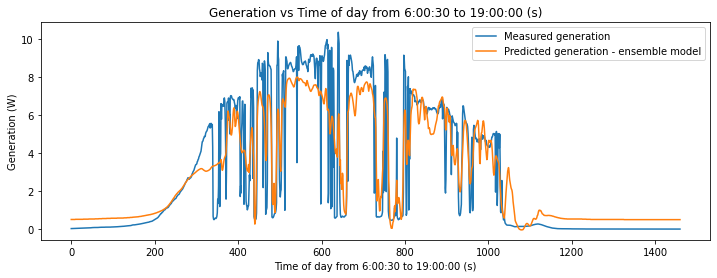

1.3047475997242899 0.83


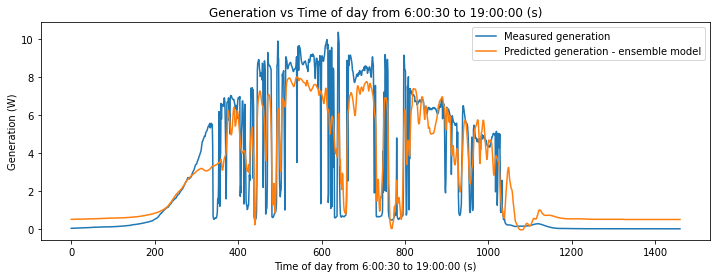

1.3009158960369551 0.84


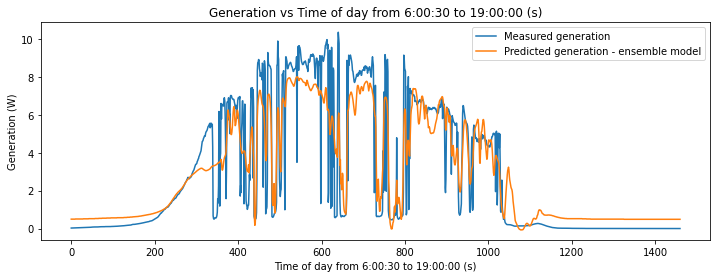

1.297188260404601 0.85


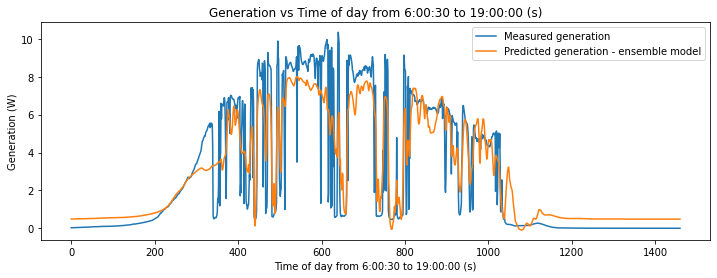

1.2935655924984595 0.86


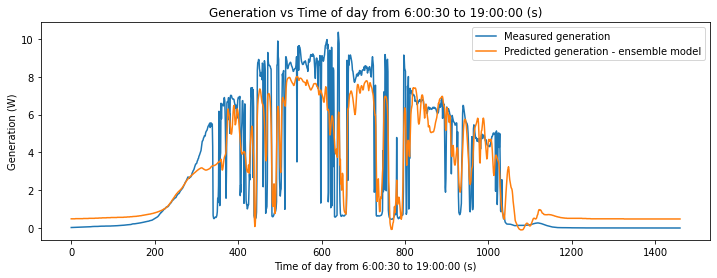

1.2900487766184665 0.87


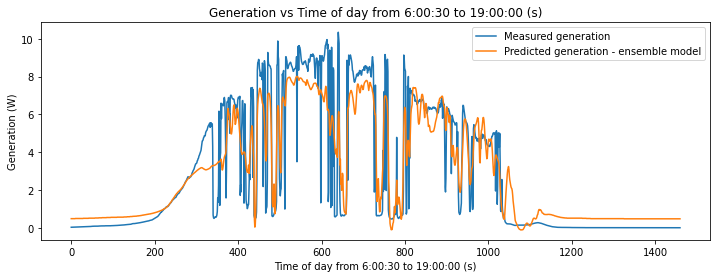

1.2866386807523775 0.88


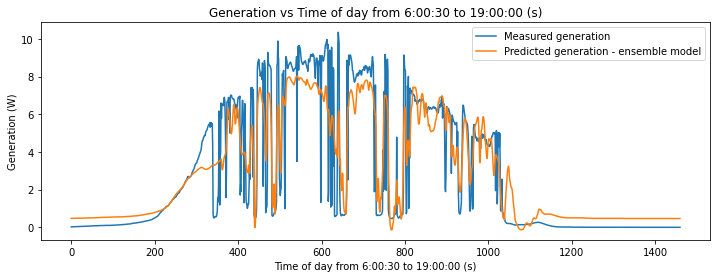

1.2833361556334997 0.89


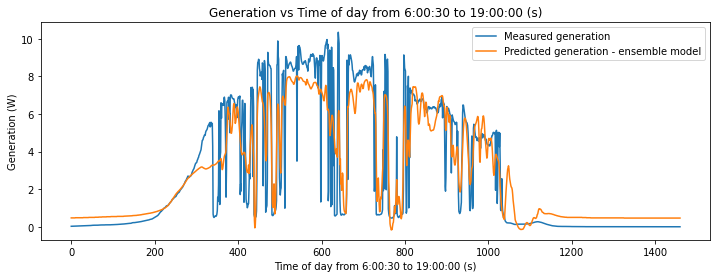

1.2801420337988336 0.9


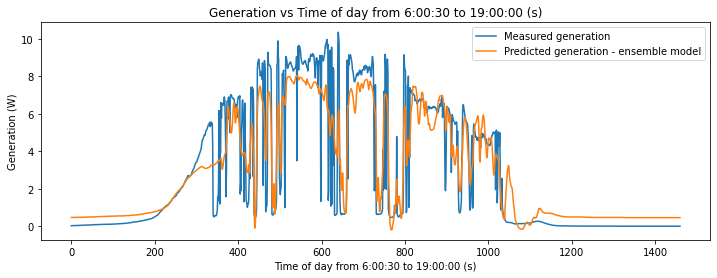

1.2770571286499375 0.91


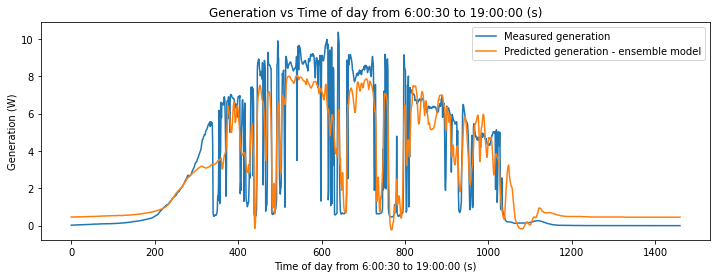

1.2740822335183495 0.92


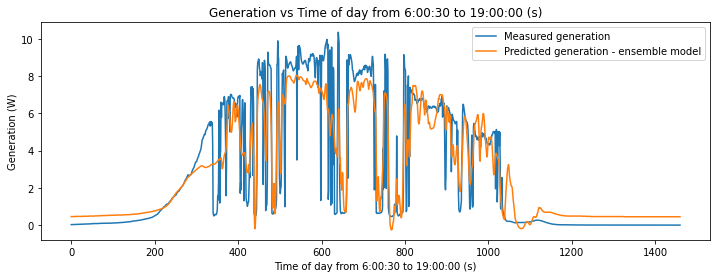

1.271218120738199 0.93


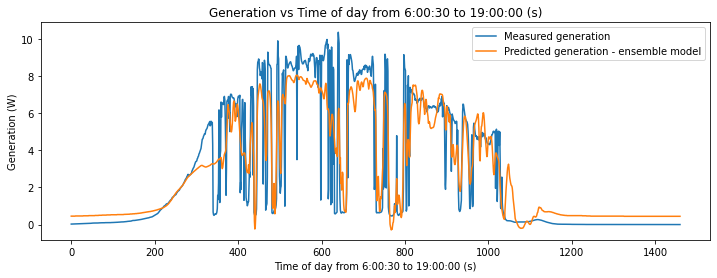

1.26846554072773 0.94


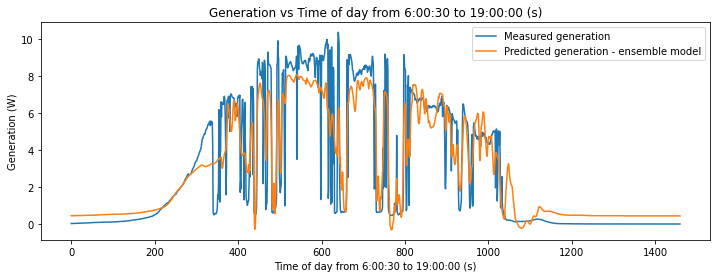

1.2658252210825776 0.95


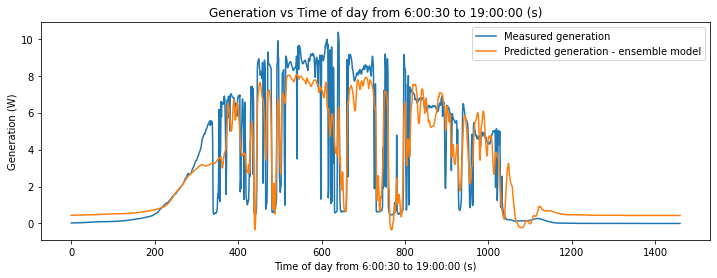

1.2632978656826606 0.96


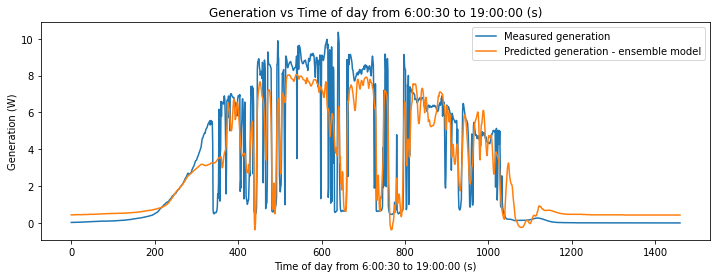

1.2608841538152786 0.97


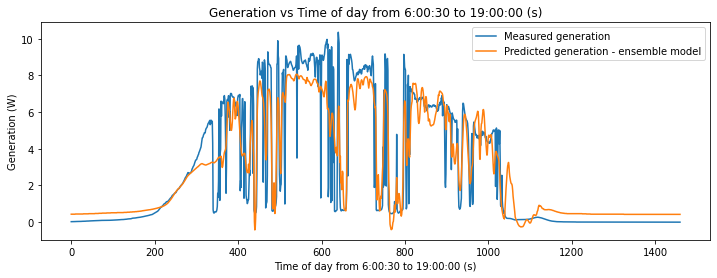

1.258584739316786 0.98


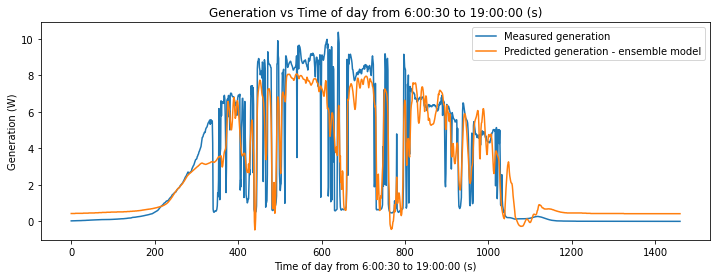

1.2564002497350288 0.99


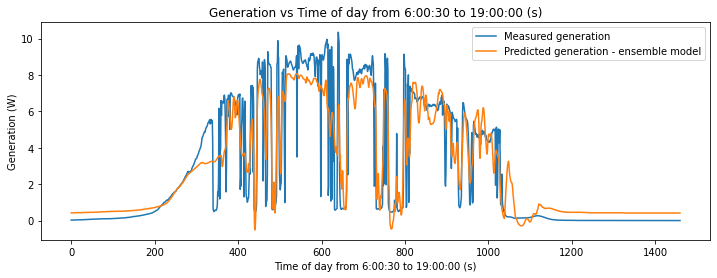

IndexError: ignored

In [ ]:
count = 0
for ensemble1 in ensemble:
  plt.figure(figsize=(12,4))
  #
  plt.plot( list(Expected1))
  plt.plot(ensemble1)
  # plt.plot(predn)
  # plt.plot(predn1)
  plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
  plt.ylabel("Generation (W)")
  plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
  plt.legend(('Measured generation','Predicted generation - ensemble model'))#, 'Predicted generation - sky imagery model', 'Predicted generation - satistical model'))
  plt.show()
  print(RMSE[count], weights_list[count])
  count +=1